In [75]:
import os 
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from Bio import PDB
import seaborn as sns
import json
import re
from io import StringIO
from Bio.SeqUtils import seq1
%matplotlib widget
import IPython
from IPython.core.display import Image
from Bio import pairwise2
from Bio.Seq import Seq
from Bio.SeqRecord import SeqRecord
from Bio.Align import MultipleSeqAlignment
from Bio.Align import AlignInfo
from sklearn.cluster import KMeans
from Bio import SeqIO
from Bio.Align.Applications import ClustalOmegaCommandline
import ipympl
from functools import wraps
from time import time

In [37]:
def colorprint(text, color):
    colors = {
        'red': '\033[91m',
        'green': '\033[92m',
        'yellow': '\033[93m',
        'blue': '\033[94m',
        'magenta': '\033[95m',
        'cyan': '\033[96m',
        'white': '\033[97m',
        'bold': '\033[1m',
        'underline': '\033[4m',
        'end': '\033[0m',
        'light_red': '\033[31m',
        'light_green': '\033[32m',
        'light_yellow': '\033[33m',
        'light_blue': '\033[34m',
        'light_magenta': '\033[35m',
        'light_cyan': '\033[36m',
        'light_gray': '\033[37m',
        'dark_gray': '\033[90m',
        'blink': '\033[5m',
        'reverse': '\033[7m',
        'hidden': '\033[8m',
        'bg_red': '\033[41m',
        'bg_green': '\033[42m',
        'bg_yellow': '\033[43m',
        'bg_blue': '\033[44m',
        'bg_magenta': '\033[45m',
        'bg_cyan': '\033[46m',
        'bg_light_gray': '\033[47m',
        'bg_dark_gray': '\033[100m',
        'bg_light_red': '\033[101m',
        'bg_light_green': '\033[102m',
        'bg_light_yellow': '\033[103m',
        'bg_light_blue': '\033[104m',
        'bg_light_magenta': '\033[105m',
        'bg_light_cyan': '\033[106m',
        'bg_white': '\033[107m'
    }
    if color in colors:
        print(colors[color] + text + colors['end'])
    else:
        print(text) 


def measure(func):
    @wraps(func)
    def _time_it(*args, **kwargs):
        start = time()
        try:
            return func(*args, **kwargs)
        finally:
            end_ = time() - start
            mins, secs = divmod(end_, 60)
            print(f"Total execution time: {mins:.0f} mins {secs:.2f} secs")
    return _time_it


import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
import numpy as np
# import matplotlib.cm as cm
from matplotlib.axes import Axes
import matplotlib
from matplotlib.lines import Line2D

# import seaborn as sns
# sns.set_theme()


colormap_list = [
    "nipy_spectral",
    "terrain",
    "gist_rainbow",
    "CMRmap",
    "coolwarm",
    "gnuplot",
    "gist_stern",
    "brg",
    "rainbow",
]


def radialTreee(
    Z2,
    fontsize=7,
    ax: Axes = None,
    pallete="gist_rainbow",
    addlabels=True,
    sample_classes=None,
    colorlabels=None,
    colorlabels_legend=None,
):

    """
    Drawing a radial dendrogram from a scipy dendrogram output.
    Parameters
    ----------
    Z2 : dictionary
        A dictionary returned by scipy.cluster.hierarchy.dendrogram
    addlabels: bool
        A bool to choose if labels are shown.
    fontsize : float
        A float to specify the font size

    ax : Axes or None:
        Axes in which to draw the plot, otherwise use the currently-active Axes.
    pallete : string

        Matlab colormap name.
    sample_classes : dict
        A dictionary that contains lists of sample subtypes or classes. These classes appear
        as color labels of each leaf. Colormaps are automatically assigned. Not compatible
        with options "colorlabels" and "colorlabels_legend".
        e.g., {"color1":["Class1","Class2","Class1","Class3", ....]}
    colorlabels : dict
        A dictionary to set color labels to leaves. The key is the name of the color label.
        The value is the list of RGB color codes, each corresponds to the color of a leaf.
        e.g., {"color1":[[1,0,0,1], ....]}
    colorlabels_legend : dict
        A nested dictionary to generate the legends of color labels. The key is the name of
        the color label. The value is a dictionary that has two keys "colors" and "labels".
        The value of "colors" is the list of RGB color codes, each corresponds to the class of a leaf.
        e.g., {"color1":{"colors":[[1,0,0,1], ....], "labels":["label1","label2",...]}}

    Returns
    -------
    Raises
    ------
    Notes
    -----
    References
    ----------
    See Also
    --------
    Examples
    --------
    """
    if ax is None:
        ax: Axes = plt.gca()
    linewidth = 1
    R = 1
    width = R * 0.1
    space = R * 0.05

    if colorlabels != None:
        offset = (
            width * len(colorlabels) / R + space * (len(colorlabels) - 1) / R + 0.05
        )
#         print(offset)
    elif sample_classes != None:
        offset = (
            width * len(sample_classes) / R
            + space * (len(sample_classes) - 1) / R
            + 0.05
        )
#         print(offset)
    else:

        offset = 0

    xmax = np.amax(Z2["icoord"])
    xmin = np.amin(Z2["icoord"])
    ymax = np.amax(Z2["dcoord"])
    # print(
    #     f"{xmax=}",
    #     np.amin(Z2["icoord"]),
    #     (xmax - xmin) / (len(Z2["ivl"]) - 1),
    #     (len(Z2["ivl"])),
    # )
    ucolors = sorted(set(Z2["color_list"]))
    # cmap = plt.cm.gist_rainbow(np.linspace(0, 1, len(ucolors)))
    cmp = plt.cm.get_cmap(pallete, len(ucolors))
    # print(cmp)
    if type(cmp) == matplotlib.colors.LinearSegmentedColormap:
        cmap = cmp(np.linspace(0, 1, len(ucolors)))
    else:
        cmap = cmp.colors

    nlabels = 0
    for icoord, dcoord, c in sorted(zip(Z2["icoord"], Z2["dcoord"], Z2["color_list"])):
        # x, y = Z2['icoord'][0], Z2['dcoord'][0]
        _color = cmap[ucolors.index(c)]
        if c == "C0":  # np.abs(_xr1)<0.000000001 and np.abs(_yr1) <0.000000001:
            _color = "black"

        # transforming original x coordinates into relative circumference positions and y into radius
        # the rightmost leaf is going to [1, 0]
        r = R * (1 - np.array(dcoord) / ymax)
        _x = np.cos(
            2 * np.pi * np.array([icoord[0], icoord[2]]) / xmax
        )  # transforming original x coordinates into x circumference positions
        _xr0 = _x[0] * r[0]
        _xr1 = _x[0] * r[1]
        _xr2 = _x[1] * r[2]
        _xr3 = _x[1] * r[3]
        _y = np.sin(
            2 * np.pi * np.array([icoord[0], icoord[2]]) / xmax
        )  # transforming original x coordinates into y circumference positions
        _yr0 = _y[0] * r[0]
        _yr1 = _y[0] * r[1]
        _yr2 = _y[1] * r[2]
        _yr3 = _y[1] * r[3]
        # ax.scatter([_xr0, _xr1, _xr2, _xr3],[_yr0, _yr1, _yr2,_yr3], c="b")

        # if y[0]>0 and y[3]>0:
        # _color="black"
        # plotting radial lines
        ax.plot([_xr0, _xr1], [_yr0, _yr1], c=_color, linewidth=linewidth)
        ax.plot([_xr2, _xr3], [_yr2, _yr3], c=_color, linewidth=linewidth)

        # plotting circular links between nodes
        if _yr1 > 0 and _yr2 > 0:
            link = np.sqrt(r[1] ** 2 - np.linspace(_xr1, _xr2, 100) ** 2)
            ax.plot(np.linspace(_xr1, _xr2, 100), link, c=_color, linewidth=linewidth)
        elif _yr1 < 0 and _yr2 < 0:
            link = -np.sqrt(r[1] ** 2 - np.linspace(_xr1, _xr2, 100) ** 2)

            ax.plot(np.linspace(_xr1, _xr2, 100), link, c=_color, linewidth=linewidth)
        elif _yr1 > 0 and _yr2 < 0:
            _r = r[1]
            if _xr1 < 0 or _xr2 < 0:
                _r = -_r
            link = np.sqrt(r[1] ** 2 - np.linspace(_xr1, _r, 100) ** 2)
            ax.plot(np.linspace(_xr1, _r, 100), link, c=_color, linewidth=linewidth)
            link = -np.sqrt(r[1] ** 2 - np.linspace(_r, _xr2, 100) ** 2)
            ax.plot(np.linspace(_r, _xr2, 100), link, c=_color, linewidth=linewidth)

    label_coords = []
    # determine the coordiante of the labels and their rotation:
    for i, label in enumerate(Z2["ivl"]):
        # scipy (1.x.x) places the leaves in x = 5+i*10 , and we can use this
        # to calulate where to put the labels
        place = (5.0 + i * 10.0) / xmax * 2
        label_coords.append(
            [
                np.cos(place * np.pi) * (1.05 + offset),  # _x
                np.sin(place * np.pi) * (1.05 + offset),  # _y
                place * 180,  # _rot
            ]
        )
    if addlabels == True:
        assert len(Z2["ivl"]) == len(label_coords), (
            f'Internal error, label numbers for Z2 ({len(Z2["ivl"])})'
            f" and for calculated labels ({len(label_coords)}) must be equal!"
        )
        for (_x, _y, _rot), label in zip(label_coords, Z2["ivl"]):
            ax.text(
                _x,
                _y,
                label,
                {"va": "center"},
                rotation_mode="anchor",
                rotation=_rot,
                fontsize=fontsize,
            )

    if colorlabels != None:
        assert len(Z2["ivl"]) == len(label_coords), (
            "Internal error, label numbers "
            + str(len(Z2["ivl"]))
            + " and "
            + str(len(label_coords))
            + " must be equal!"
        )

        j = 0
        outerrad = R * 1.05 + width * len(colorlabels) + space * (len(colorlabels) - 1)

#         print(outerrad)
        # sort_index=np.argsort(Z2['icoord'])
        # print(sort_index)
        intervals = []
        for i in range(len(label_coords)):
            _xl, _yl, _rotl = label_coords[i - 1]
            _x, _y, _rot = label_coords[i]
            if i == len(label_coords) - 1:
                _xr, _yr, _rotr = label_coords[0]
            else:
                _xr, _yr, _rotr = label_coords[i + 1]
            d = ((_xr - _xl) ** 2 + (_yr - _yl) ** 2) ** 0.5
            intervals.append(d)
        colorpos = intervals  # np.ones([len(label_coords)])
        labelnames = []
        for labelname, colorlist in colorlabels.items():

            colorlist = np.array(colorlist)[Z2["leaves"]]
            outerrad = outerrad - width * j - space * j
            innerrad = outerrad - width
            patches, texts = ax.pie(
                colorpos,
                colors=colorlist,
                radius=outerrad,
                counterclock=True,
                startangle=label_coords[0][2] * 0.5,
                wedgeprops=dict(
                    width=width,
                    # edgecolor='w', #if this is active the wedges will be more clearly separated
                ),
            )


            labelnames.append(labelname)
            j += 1

        if colorlabels_legend != None:
            for i, labelname in enumerate(labelnames):
#                 print(colorlabels_legend[labelname]["colors"])
                colorlines = []
                for c in colorlabels_legend[labelname]["colors"]:
                    colorlines.append(Line2D([0], [0], color=c, lw=4))

                leg = ax.legend(
                    colorlines,
                    colorlabels_legend[labelname]["labels"],
                    bbox_to_anchor=(1.5 + 0.3 * i, 1.0),
                    title=labelname,
                )
                ax.add_artist(leg)
    elif sample_classes != None:
        assert len(Z2["ivl"]) == len(label_coords), (
            "Internal error, label numbers "
            + str(len(Z2["ivl"]))
            + " and "
            + str(len(label_coords))
            + " must be equal!"
        )

        j = 0
        outerrad = (
            R * 1.05 + width * len(sample_classes) + space * (len(sample_classes) - 1)
        )

#         print(outerrad)
        # sort_index=np.argsort(Z2['icoord'])
        # print(sort_index)
        intervals = []
        for i in range(len(label_coords)):
            _xl, _yl, _rotl = label_coords[i - 1]
            _x, _y, _rot = label_coords[i]
            if i == len(label_coords) - 1:
                _xr, _yr, _rotr = label_coords[0]
            else:
                _xr, _yr, _rotr = label_coords[i + 1]
            d = ((_xr - _xl) ** 2 + (_yr - _yl) ** 2) ** 0.5
            intervals.append(d)
        colorpos = intervals  # np.ones([len(label_coords)])
        labelnames = []
        colorlabels_legend = {}
        for labelname, colorlist in sample_classes.items():

            ucolors = sorted(list(np.unique(colorlist)))
            type_num = len(ucolors)
            _cmp = plt.cm.get_cmap(colormap_list[j], type_num)
            _colorlist = [_cmp(ucolors.index(c)) for c in colorlist]
            _colorlist = np.array(_colorlist)[Z2["leaves"]]
            outerrad = outerrad - width * j - space * j
            innerrad = outerrad - width
            patches, texts = ax.pie(
                colorpos,
                colors=_colorlist,
                radius=outerrad,
                counterclock=True,
                startangle=label_coords[0][2] * 0.5,
                wedgeprops=dict(
                    width=width,
                    # edgecolor='w', #if this is active the wedges will be more clearly separated
                ),
            )


            labelnames.append(labelname)
            colorlabels_legend[labelname] = {}
            colorlabels_legend[labelname]["colors"] = _cmp(np.linspace(0, 1, type_num))
            colorlabels_legend[labelname]["labels"] = ucolors
            j += 1

        if colorlabels_legend != None:
            for i, labelname in enumerate(labelnames):
#                 print(colorlabels_legend[labelname]["colors"])
                colorlines = []
                for c in colorlabels_legend[labelname]["colors"]:
                    colorlines.append(Line2D([0], [0], color=c, lw=4))
                leg = ax.legend(
                    colorlines,
                    colorlabels_legend[labelname]["labels"],
                    bbox_to_anchor=(1.5 + 0.3 * i, 1.0),
                    title=labelname,
                )
                ax.add_artist(leg)
            # break
#     print('ERROR IS HERE')
    ax.set_frame_on(False)
    
#     ax.spines.right.set_visible(False)
#     ax.spines.top.set_visible(False)
#     ax.spines.left.set_visible(False)
#     ax.spines.bottom.set_visible(False)
    ax.set_xticks([])
    ax.set_yticks([])
    if colorlabels != None:
        maxr = R * 1.05 + width * len(colorlabels) + space * (len(colorlabels) - 1)
    elif sample_classes != None:
        maxr = (
            R * 1.05 + width * len(sample_classes) + space * (len(sample_classes) - 1)
        )
    else:
        maxr = R * 1.05
    ax.set_xlim(-maxr, maxr)
    ax.set_ylim(-maxr, maxr)
    return ax


def plot(
    Z2,
    fontsize=6,
    figsize=None,
    pallete="gist_rainbow",
    addlabels=True,
    show=True,
    sample_classes=None,
    colorlabels=None,
    colorlabels_legend=None,
):
    """
    Drawing a radial dendrogram from a scipy dendrogram output.
    Parameters
    ----------
    Z2 : dictionary
        A dictionary returned by scipy.cluster.hierarchy.dendrogram
    addlabels: bool
        A bool to choose if labels are shown.
    fontsize : float
        A float to specify the font size
    figsize : [x, y] array-like
        1D array-like of floats to specify the figure size
    pallete : string
        Matlab colormap name.
    sample_classes : dict
        A dictionary that contains lists of sample subtypes or classes. These classes appear
        as color labels of each leaf. Colormaps are automatically assigned. Not compatible
        with options "colorlabels" and "colorlabels_legend".
        e.g., {"color1":["Class1","Class2","Class1","Class3", ....]}
    colorlabels : dict
        A dictionary to set color labels to leaves. The key is the name of the color label.
        The value is the list of RGB color codes, each corresponds to the color of a leaf.
        e.g., {"color1":[[1,0,0,1], ....]}
    colorlabels_legend : dict
        A nested dictionary to generate the legends of color labels. The key is the name of
        the color label. The value is a dictionary that has two keys "colors" and "labels".
        The value of "colors" is the list of RGB color codes, each corresponds to the class of a leaf.
        e.g., {"color1":{"colors":[[1,0,0,1], ....], "labels":["label1","label2",...]}}

    Returns
    -------
    Raises
    ------
    Notes
    -----
    References
    ----------
    See Also
    --------
    Examples
    --------
    """

    plt.rcParams["font.family"] = "sans-serif"
    plt.rcParams["font.sans-serif"] = ["Arial"]
    plt.rcParams["svg.fonttype"] = "none"

    if figsize == None and colorlabels != None:
        figsize = [10, 5]
    elif figsize == None and sample_classes != None:
        figsize = [10, 5]
    elif figsize == None:
        figsize = [5, 5]
    fig, ax = plt.subplots(figsize=figsize)
    ax = radialTreee(
        Z2,
        fontsize=fontsize,
        ax=ax,
        pallete=pallete,
        addlabels=addlabels,
        sample_classes=sample_classes,
        colorlabels=colorlabels,
        colorlabels_legend=colorlabels_legend,
    )

    if show == True:
        plt.show()
    else:
        return ax


def mat_plot(mat):
    # Take a matrix data instead of a dendrogram data, calculate dendrogram and draw a circular dendrogram
    pass


def pandas_plot(df):

    pass


def _test_1(Z2):
    # optionally leaves can be labeled by colors
    type_num = 12
    _cmp = plt.cm.get_cmap("bwr", type_num)
    _cmp2 = plt.cm.get_cmap("hot", type_num)
    colors_dict = {
        "example_color": _cmp(np.random.rand(numleaf)),
        "example_color2": _cmp2(np.random.rand(numleaf)),
    }
    colors_legends = {
        "example_color": {
            "colors": _cmp(np.linspace(0, 1, type_num)),
            "labels": ["ex1_" + str(i + 1) for i in range(type_num)],
        },
        "example_color2": {
            "colors": _cmp2(np.linspace(0, 1, type_num)),
            "labels": ["ex2_" + str(i + 1) for i in range(type_num)],
        },
    }
    # fig = pylab.figure(figsize=(8,8))

    # Compute and plot the dendrogram.
    # ax2 = fig.add_axes([0.3,0.71,0.6,0.2])

    fig, ax = plt.subplots(figsize=(10, 5))
    # plot(Z2, colorlabels=colors_dict,colorlabels_legend=colors_legends,show=True)
    radialTreee(Z2, ax=ax, colorlabels=colors_dict, colorlabels_legend=colors_legends)
    plt.show()


def _test_2(Z2):
    type_num = 6
    type_list = ["ex" + str(i) for i in range(type_num)]
    sample_classes = {
        "example_color": [np.random.choice(type_list) for i in range(numleaf)]
    }
    fig, ax = plt.subplots(figsize=(10, 5))
    radialTreee(Z2, ax=ax, sample_classes=sample_classes)
    plt.show()
    # plot(Z2, sample_classes=sample_classes,show=True)


def _test_3(Z2):
    fig, ax = plt.subplots(2, 2, figsize=(10, 10))
    ax = ax.flatten()
    # no arguments
    radialTreee(Z2, ax=ax[0])
    ax[0].set_aspect(1)

    type_num = 12
    _cmp = plt.cm.get_cmap("bwr", type_num)
    _cmp2 = plt.cm.get_cmap("hot", type_num)
    colors_dict = {
        "example_color": _cmp(np.random.rand(numleaf)),
        "example_color2": _cmp2(np.random.rand(numleaf)),
    }
    colors_legends = {
        "example_color": {
            "colors": _cmp(np.linspace(0, 1, type_num)),
            "labels": ["ex1_" + str(i + 1) for i in range(type_num)],
        },
        "example_color2": {
            "colors": _cmp2(np.linspace(0, 1, type_num)),
            "labels": ["ex2_" + str(i + 1) for i in range(type_num)],
        },
    }
    # fig = pylab.figure(figsize=(8,8))

    # Compute and plot the dendrogram.
    # ax2 = fig.add_axes([0.3,0.71,0.6,0.2])

    # like in test_1
    radialTreee(
        Z2, ax=ax[1], colorlabels=colors_dict, colorlabels_legend=colors_legends
    )

    type_num = 6
    type_list = ["ex" + str(i) for i in range(type_num)]
    sample_classes = {
        "example_color": [np.random.choice(type_list) for i in range(numleaf)]
    }
    radialTreee(Z2, ax=ax[2], sample_classes=sample_classes)
    ax[3].axis("off")
    plt.show()



# Assignment questions
> We are providing as set of shuffled protein sequences which have been extracted from several known
families. On the basis of their sequences, it is possible to identify those that are indeed related. 

>1. Write some code that can somehow retrieve how these sequences are related and how they belong to the
same family.

>2. You have to provide a visualisation of these families as a network graph computed within
the same code.

>3. Document your code and make sure it is easy to install and run. 

>4. Communication skills are also important: you need to write a small presentation about how you solved the problem, what are some possible improvement to your methodology, how to make it scalable, etc. 

>5. Creative problem solving is an important aspect hence there are multiple ways in which this problem could be solved. 

## load the sequence data and look at the distribution of sequence lengths

In [6]:
## import paths

input_dir = 'C:\\Users\\32470\\Downloads\\Biostrand_assignment\\'          # current working directory of input
output_dir = input_dir+'outdir\\'     # current output folder to store output of this notebook in case


In [7]:
seq_file = pd.read_csv(input_dir+'\\test data scientist shuffled sequences BioStrand.csv', index_col=0, header=0)
seq_file['seq_len'] = [len(x) for x in seq_file['original_sequence']]
print(seq_file)

                                     original_sequence  seq_len
id                                                             
0    GLSDGEWQQVLNVWGKVEADIAGHGQEVLIRLFTGHPETLEKFDKF...      153
1    QSVLTQPPSVSGAPGQRVTISCTGSRSNMGAGYDVHWYQLLPGAAP...      217
2    VQWSAEEKQLISSLWGKVNVAECGAEALARLLIVYPWTQRFFTSFG...      146
3    MHGQVDSSPGIWQLDCTHLEGKVILVAVHVASGYIEAEVIPAETGQ...      163
4    MHLTPEEKSAVTALWGKVNVDEVGGEALGRLLVVYPHTQRFFESFG...      146
..                                                 ...      ...
406  GSHMPKRGRPAATEVKIPKPRGRPPLPAGTNSKGPPDFSSDEEREP...      364
407  CVNLTTRTQLPPAYTNSFTRGVYYPDKVFRSSVLHSTQDLFLPFFS...     1274
408  MVLSEGEWQLVLHVWAKVEADVAGHGQDILIRLFKSHPETLEKFDR...      154
409  VQLSGEEKAAVLALWDKVNEEEVGGEALGRLLVVYPWTQRFFDSFG...      145
410  MVLSEGEWQLVLHVWAKVEADVAGHGQDILIRLFKSHPETLEKFDR...      154

[411 rows x 2 columns]


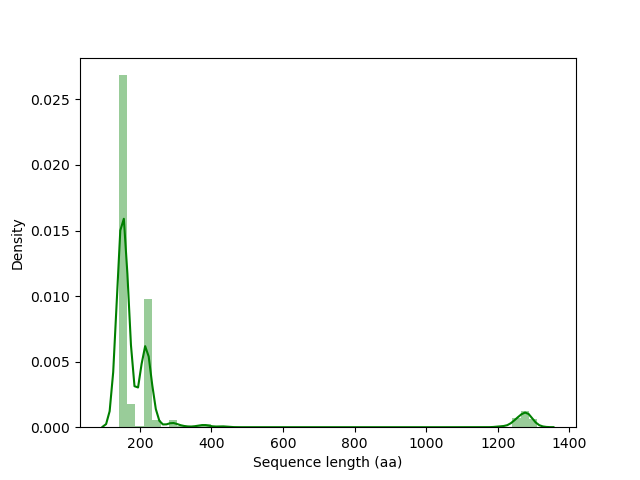

In [6]:
## since there are 400 sequences, to align them first its required to have an idea of how long they are:
plt.close()
sns.distplot(seq_file['seq_len'], color='green')
plt.xlabel('Sequence length (aa)')
plt.ylabel('Density')
plt.show()

## There are three webserver/tools that are used:
### CD-HIT (filtering step): To find redundant sequences that have >= 90% sequence identity.
### MUSCLE (sequence alignment): A sequence alignment of 411 sequences for which the families are currently unknown.
### BLAST: To find sequence annotations for described clusters

# <font color='red'>1. CD-HIT analysis </font>

In [38]:
read_fasta_seq_all = SeqIO.parse(input_dir+'CDhit\\1711655125.fas.0', "fasta")
read_fasta_seq_ref = SeqIO.parse(input_dir+'CDhit\\1711655125.fas.1', "fasta")
fasta_sequences_all = {seq_record.id: seq_record.seq for seq_record in read_fasta_seq_all}
fasta_sequences_ref = {seq_record.id: seq_record.seq for seq_record in read_fasta_seq_ref}
print('TOTAL REFERENCE SEQUENCES', len(fasta_sequences_ref.keys()))
print('TOTAL SEQUENCES', len(fasta_sequences_all.keys()))

# NOTE: be careful for +1 indexing, sequence_1 has index 0 in seq_len dataframe 


TOTAL REFERENCE SEQUENCES 45
TOTAL SEQUENCES 411


In [39]:
fasta_sequences_ref

{'sequence_3': Seq('VQWSAEEKQLISSLWGKVNVAECGAEALARLLIVYPWTQRFFTSFGNLSSASAI...KYH'),
 'sequence_10': Seq('VHLTAAEKSAILDLWGKVNVGEIGAEALGRLLVVYPWTQRFFEKFGDLSSASAI...KYH'),
 'sequence_13': Seq('VHLTDAEKAAVSCLWGKVNSDEVGGEALGRLLVVYPWTQRYFDSFGDLSSASAI...KYH'),
 'sequence_15': Seq('MLTAEEKAAVTAFWGKVKVDEVGGEALGRLLVVYPWTQRFFESFGDLSTADAVM...RYH'),
 'sequence_17': Seq('GSHMGLSDGEWQLVLNVWGKVEADVAGHGQEVLIRLFTGHPETLEKFDKFKHLK...FQG'),
 'sequence_20': Seq('GLSDGEWHLVLNVWGKVETDLAGHGQEVLIRLFKSHPETLEKFDKFKHLKSEDD...FHG'),
 'sequence_26': Seq('MVHLTPEEKSAVTALWGKVNVDEVGGEALGRLLVVYPWTQRFFESFGDLSTPDA...KYH'),
 'sequence_35': Seq('VHLSGEEKAAVTALWGKVNVDEVGGETLGRLLVVYPWTQRFFETFGDLSSASAV...KYH'),
 'sequence_41': Seq('GFLDGIEKAQEEHEKYHNNWRAMAEDFQIPQVVAKEIVAQCPKCQVKGEAMHGQ...EKD'),
 'sequence_44': Seq('QSVLTQPPSASGTPGQRVTISCSGSSSNIGENSVTWYQHLSGTAPKLLIYEDNS...ECS'),
 'sequence_54': Seq('QSVLTQPPSVSGAPGQRVTISCTGSSSNIGAGYAVHWYQQLPGTAPKLLISGNS...ARQ'),
 'sequence_70': Seq('XGHFTEEDKATITSLWGKVNVEDAGGETLGRLLVVYPWTQRFFDS

In [40]:
import re

def read_cluster_file(filename):
    ## read the CD-HIT cluster file
    clusters = []
    with open(filename, 'r') as file:
        current_cluster = None
        for line in file:
            line = line.strip()
            if line.startswith('>'):
                if current_cluster is not None:
                    clusters.append(current_cluster)
                current_cluster = {'Cluster': line.split('>')[1], 'Data': [], 'Reference': []}
            else:
                parts = line.split('\t')
                sequence_info = parts[1].split('... at ')
#                 print(len(sequence_info))
                if len(sequence_info) < 2:
                    current_cluster['Reference'].append([int(sequence_info[0].split(',')[0][:-2]), sequence_info[0].split('>')[1], 'reference'])
                elif len(sequence_info) == 2:
                    identity = float(re.findall(r'\d+\.\d+', sequence_info[1])[0])
#                     print(type(identity))
#                     print(float(identity))
                    current_cluster['Data'].append([int(sequence_info[0].split(',')[0][:-2]), sequence_info[0].split('>')[1], float(identity)])
        if current_cluster is not None:
            clusters.append(current_cluster)
    return clusters

filename = input_dir+'CDhit\\1711655125.fas.1.clstr.sorted'
cluster_data = read_cluster_file(filename)


### <font color='red'> create a dataframe from all the clusters including sequence and identity info </font>
### <font color='red'> create a dataframe of 'reference sequences' in each cluster. The reference sequence is the reference sequence from each cluster. </font>

In [41]:
clusters_dict = {}
reference_ids = []
for cluster in cluster_data:
#     print(cluster['Cluster'])
    # Define column names
    
    ref_list = cluster['Reference'][0]
    seq_id_ref = int(ref_list[1].split('... *')[0].split('_')[1])
#     print(seq_id_ref)
    ref_list.append(cluster['Cluster'])
    ref_list.append('sequence_'+str(seq_id_ref))
    ref_list.append(str(fasta_sequences_ref[f'sequence_{seq_id_ref}']))
#     print(fasta_sequences[f'sequence_{seq_id_ref}'])
#     print(ref_list)
    reference_ids.append(ref_list)
#     # Create DataFrame
    try:
        print(cluster['Cluster'])
        columns = ['seq_len (aa)', 'seq_id', 'identity (%)']
        df = pd.DataFrame(cluster['Data'], columns=columns)
        df['cluster_id'] = [cluster['Cluster'] for i in df.index]
        df['sequence_id'] = [int(x.split('_')[1]) for x in df['seq_id']]
# #         print(df)
        df['sequence'] = [''.join(fasta_sequences_all[f'sequence_{x}']) for x in df['sequence_id']]
#         print(df.head())
#         print()
#         print([fasta_sequences[f'sequence_{x}'] for x in df['sequence_id']])
        clusters_dict.update({cluster['Cluster']: df})
    except:
        pass

Cluster 0
Cluster 1
Cluster 2
Cluster 3
Cluster 4
Cluster 5
Cluster 6
Cluster 7
Cluster 8
Cluster 9
Cluster 10
Cluster 11
Cluster 12
Cluster 13
Cluster 14
Cluster 15
Cluster 16
Cluster 17
Cluster 18
Cluster 19
Cluster 20
Cluster 21
Cluster 22
Cluster 23
Cluster 24
Cluster 25
Cluster 26
Cluster 27
Cluster 28
Cluster 29
Cluster 30
Cluster 31
Cluster 32
Cluster 33
Cluster 34
Cluster 35
Cluster 36
Cluster 37
Cluster 38
Cluster 39
Cluster 40
Cluster 41
Cluster 42
Cluster 43
Cluster 44


### <font color='red'> There are 45 cluster references computed by CD-HIT for which there ares sequences with >= 90% identity. About half of them have no designated sequences. </font>

In [42]:
# reference sequence dataframe with all info
reference_df = pd.DataFrame([x for x in reference_ids])
reference_df.columns = ['seq_len (aa)', 'seq_id', 'identity (%)', 'cluster_id', 'sequence_id', 'sequence']
print('CD-HIT reference sequences dataframe')
reference_df.head()


CD-HIT reference sequences dataframe


,seq_len (aa),seq_id,identity (%),cluster_id,sequence_id,sequence
0,163,sequence_180... *,reference,Cluster 0,sequence_180,MVLSEGEWQLVLHVWAKVEADVAGHGQDILIRLFKSHPETLEKFDR...
1,147,sequence_26... *,reference,Cluster 1,sequence_26,MVHLTPEEKSAVTALWGKVNVDEVGGEALGRLLVVYPWTQRFFESF...
2,157,sequence_17... *,reference,Cluster 2,sequence_17,GSHMGLSDGEWQLVLNVWGKVEADVAGHGQEVLIRLFTGHPETLEK...
3,243,sequence_115... *,reference,Cluster 3,sequence_115,KLAATMVLQTQVFISLLLWISGAYGQSVLTQPPSASGTPGQRVTIS...
4,220,sequence_54... *,reference,Cluster 4,sequence_54,QSVLTQPPSVSGAPGQRVTISCTGSSSNIGAGYAVHWYQQLPGTAP...


In [43]:
plt.close('all')
## VISUALLY CHECK IF THE SEQUENCES ARE SAME BASED ON DICT AND SEQ_LEN DATAFRAME 
for i in clusters_dict.keys():
    print(i)
#     print('REFERENCE SEQUENCE')
    colorprint(reference_df[reference_df['cluster_id'] == i]['sequence'].values[0], 'blue')
    list_seq = clusters_dict[i]['sequence_id']
#     print(list_seq)
    
    clusterseq_df = clusters_dict[i]
    
# #     print(clusterseq_df.head())
#     print(len(clusterseq_df['sequence'].unique()), clusterseq_df.shape[0])
    for id_ in list_seq:
#         print(id_)
        index_orig = id_ - 1
# #     #         
        colorprint(clusterseq_df[clusterseq_df['sequence_id'] == id_]['sequence'].values[0], 'green')
# #         colorprint(seq_file.iloc[index_orig]['original_sequence'], 'red')
#         print()
        break
    break

Cluster 0
MVLSEGEWQLVLHVWAKVEADVAGHGQDILIRLFKSHPETLEKFDRFKHLKTEAEMKASEDLKKHGVTVLTALGAILKKKGHHEAELKPLAQSHATKHKIPIKYLEFISEAIIHVLHSRHPGDFGADAQGAMNKALELFRKDIAAKYKELGYQGGSGHHHHHH
MVLSEGEWQLVLHVWAKVEADVAGHGQDILIRLFKSHPETLEKFDRFKHLKTEAEMKASEDLKKLGVTVLTALGAILKKKGHHEAELKPLAQSHATKHKIPIKYLEFISEAIIHVLHSRHPGNFGADAQGAMNKALELFRKDIAAKYKELGYQG


In [44]:
## SEQUENCE IDENTITY OF EACH SEQUENCE WITHIN A CD-HIT CLUSTER
identity_all_clusters = pd.DataFrame({x: y['identity (%)'] for x, y in clusters_dict.items()})
print(identity_all_clusters)

    Cluster 0  Cluster 1  Cluster 2  Cluster 3  Cluster 4  Cluster 5  \
0       98.70      98.63      92.81      93.06      94.01      96.32   
1       98.70      98.63      94.12      95.31      95.39     100.00   
2       96.75      98.63      94.77      94.42      94.47      96.99   
3       98.70      99.32      94.77      95.37      93.27      95.83   
4       98.70      98.63      90.85      93.06      96.31      97.60   
..        ...        ...        ...        ...        ...        ...   
91     100.00        NaN        NaN        NaN        NaN        NaN   
92      98.68        NaN        NaN        NaN        NaN        NaN   
93      98.04        NaN        NaN        NaN        NaN        NaN   
94      98.70        NaN        NaN        NaN        NaN        NaN   
95      98.70        NaN        NaN        NaN        NaN        NaN   

    Cluster 6  Cluster 7  Cluster 8  Cluster 9  ...  Cluster 13  Cluster 14  \
0       96.24      97.39      91.36      92.47  ...     

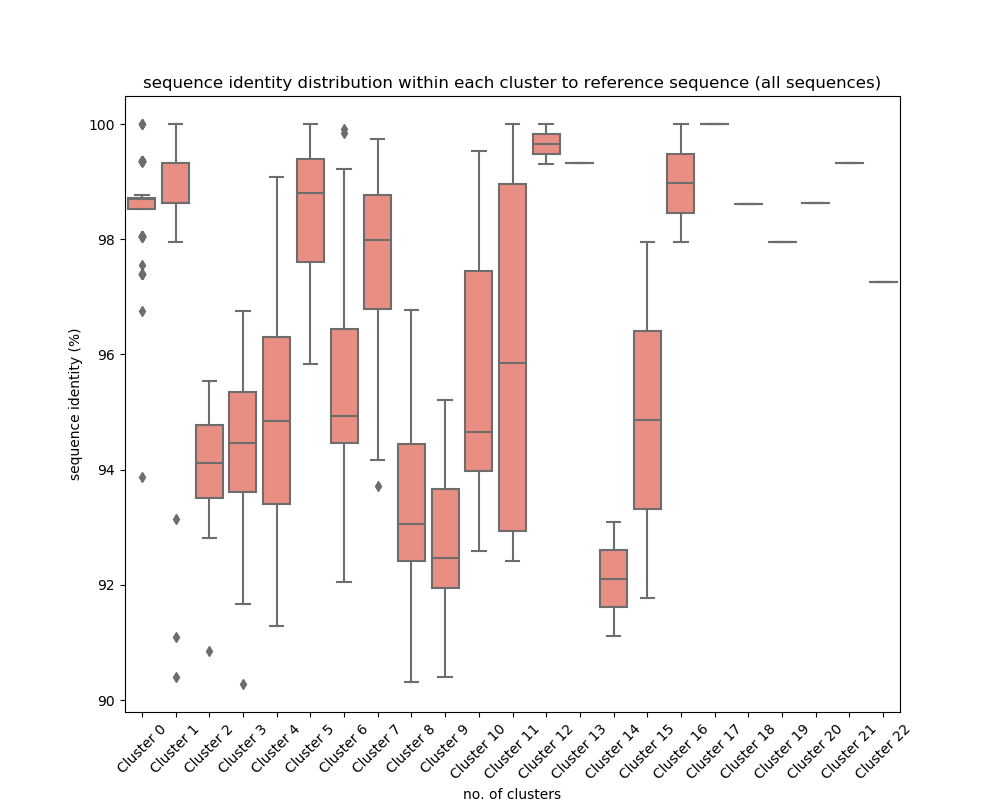

In [89]:
plt.close()
# for x in identity_all_clusters.columns:
# Convert the DataFrame to long format
identity_all_clusters_long = identity_all_clusters.melt(var_name='Columns', value_name='Values')
# print(identity_all_clusters_long)

fig, ax = plt.subplots(figsize=(10, 8))
# Create a boxplot with multiple columns using Seaborn
sns.boxplot(data=identity_all_clusters_long, x='Columns', y='Values', color='salmon')

# Set plot title and labels
ax.set_title('sequence identity distribution within each cluster to reference sequence (all sequences)')
ax.set_ylabel('sequence identity (%)')
ax.set_xlabel('no. of clusters')
plt.xticks(rotation=45,fontsize=10)
# plt.xticklabels(fontsize=10)

plt.savefig(output_dir+'cluster_similarity.png', bbox_inches='tight')
plt.show()

# <font color='green'>2. Multiple sequence alignment using MUSCLE </font>

In [45]:
muscle_msa_ref = pd.read_csv(input_dir+'MUSCLE\\output2_ref_seq\\muscle-I20240329-191032-0822-93888983-p1m-pim.txt', skiprows=4, delimiter='\t')
print(muscle_msa_ref.head())

                                                   #
0       1: sequence_316  100.00   10.07   10.79  ...
1       2: sequence_41    10.07  100.00   74.39  ...
2       3: sequence_407   10.79   74.39  100.00  ...
3       4: sequence_141   10.79   72.57   81.89  ...
4       5: sequence_210   12.84   69.40   89.07  ...


### <font color='green'>divide MSA based on CD-HIT reference and sequence clusters </font> 

In [46]:
row_ = {}
for x in muscle_msa_ref.index:
    filtered_row = [item for item in muscle_msa_ref.iloc[x].values[0].split(':')[1].split(' ') if item != '']
    filtered_row_num = [float(x) for x in filtered_row[1:]]
#     print(filtered_row_num)
    row_.update({filtered_row[0]: filtered_row_num})
    
muscle_df_ref = pd.DataFrame(row_).T
muscle_df_ref.columns = muscle_df_ref.index
print(muscle_df_ref.head())

              sequence_316  sequence_41  sequence_407  sequence_141  \
sequence_316        100.00        10.07         10.79         10.79   
sequence_41          10.07       100.00         74.39         72.57   
sequence_407         10.79        74.39        100.00         81.89   
sequence_141         10.79        72.57         81.89        100.00   
sequence_210         12.84        69.40         89.07         89.07   

              sequence_210  sequence_232  sequence_304  sequence_390  \
sequence_316         12.84         13.70         10.49         13.85   
sequence_41          69.40         10.48          8.64         21.53   
sequence_407         89.07          9.09          7.82         19.44   
sequence_141         89.07          9.09          7.82         18.75   
sequence_210        100.00          8.72          7.91         19.61   

              sequence_3  sequence_70  ...  sequence_345  sequence_92  \
sequence_316       13.08        12.21  ...          4.58         3.

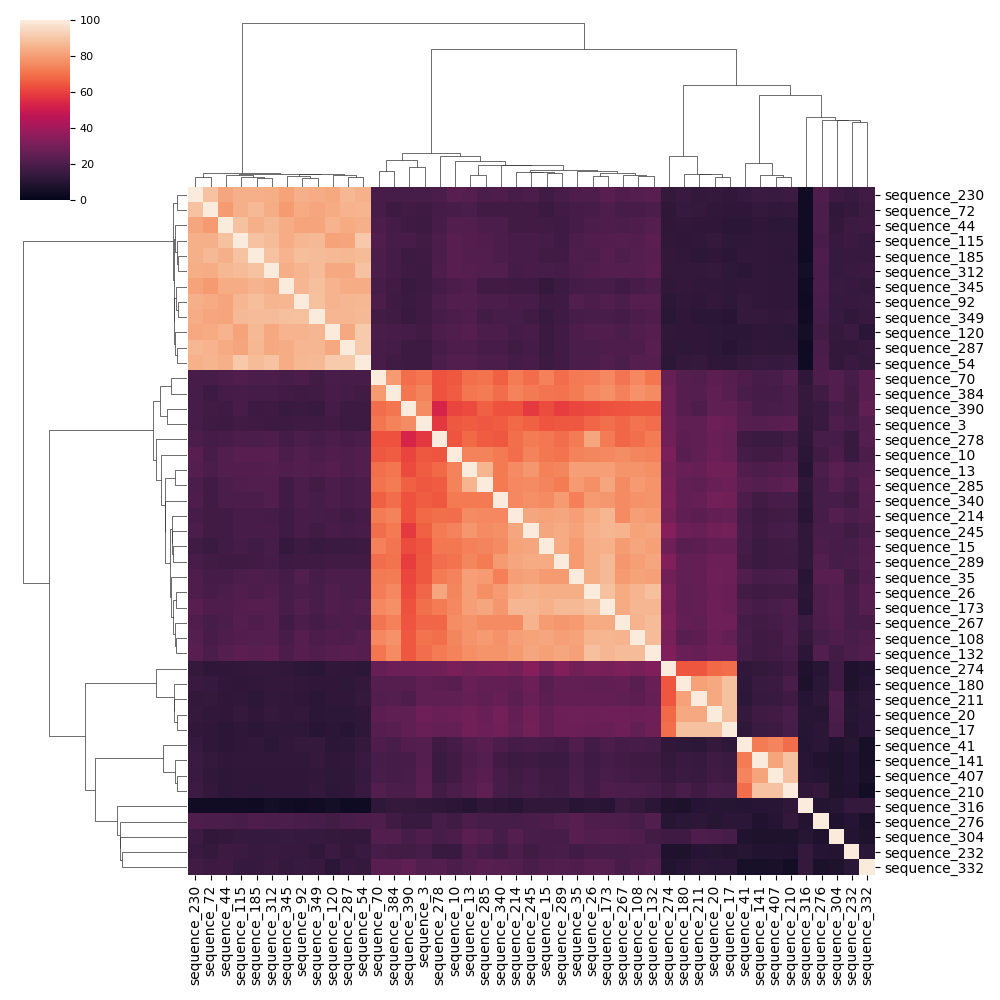

In [47]:
plt.close('all')
sns.clustermap(muscle_df_ref, vmin=0, vmax=100, row_cluster=True, col_cluster=True, yticklabels=1, xticklabels=1)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.show()

In [48]:
muscle_msa_all = pd.read_csv(input_dir+'MUSCLE\\output1_all_seq\\muscle-I20240328-194746-0627-19218052-p1m-pim.txt', skiprows=4, delimiter='\t')
print(muscle_msa_all)
row_2 = {}
for x in muscle_msa_all.index:
    filtered_row = [item for item in muscle_msa_all.iloc[x].values[0].split(':')[1].split(' ') if item != '']
    filtered_row_2num = [float(x) for x in filtered_row[1:]]
#     print(filtered_row_2num)
    row_2.update({filtered_row[0]: filtered_row_2num})
#     break

muscle_df_all = pd.DataFrame(row_2).T
muscle_df_all.columns = muscle_df_all.index
muscle_df_all.head()

                                                     #
0         1: sequence_316  100.00    8.96    8.28  ...
1         2: sequence_232    8.96  100.00    8.64  ...
2         3: sequence_304    8.28    8.64  100.00  ...
3         4: sequence_174   12.14    5.86    8.58  ...
4         5: sequence_189   12.14    5.86    8.58  ...
..                                                 ...
406     407: sequence_110   10.45   14.21   16.59  ...
407     408: sequence_99    10.45   14.66   16.50  ...
408     409: sequence_324   10.45   14.66   16.50  ...
409     410: sequence_345   11.19   15.18   16.02  ...
410     411: sequence_402   11.94   15.18   16.02  ...

[411 rows x 1 columns]


,sequence_316,sequence_232,sequence_304,sequence_174,sequence_189,sequence_31,sequence_41,sequence_66,sequence_109,sequence_40,...,sequence_349,sequence_320,sequence_224,sequence_313,sequence_373,sequence_110,sequence_99,sequence_324,sequence_345,sequence_402
sequence_316,100.00,8.96,8.28,12.14,12.14,12.14,12.14,10.94,10.94,10.94,...,10.14,11.19,10.45,10.45,10.45,10.45,10.45,10.45,11.19,11.94
sequence_232,8.96,100.00,8.64,5.86,5.86,5.86,5.86,6.41,5.77,6.58,...,14.14,14.66,14.74,14.66,14.74,14.21,14.66,14.66,15.18,15.18
sequence_304,8.28,8.64,100.00,8.58,8.58,8.58,8.58,9.82,9.82,10.06,...,16.19,16.50,16.59,16.50,16.59,16.59,16.50,16.50,16.02,16.02
sequence_174,12.14,5.86,8.58,100.00,98.97,99.31,99.30,69.78,69.23,76.83,...,10.47,10.16,10.22,10.16,9.95,10.11,10.16,10.16,9.63,10.16
sequence_189,12.14,5.86,8.58,98.97,100.00,99.65,99.65,70.88,70.33,78.05,...,10.99,10.70,10.75,10.70,10.47,10.64,10.70,10.70,10.16,10.70


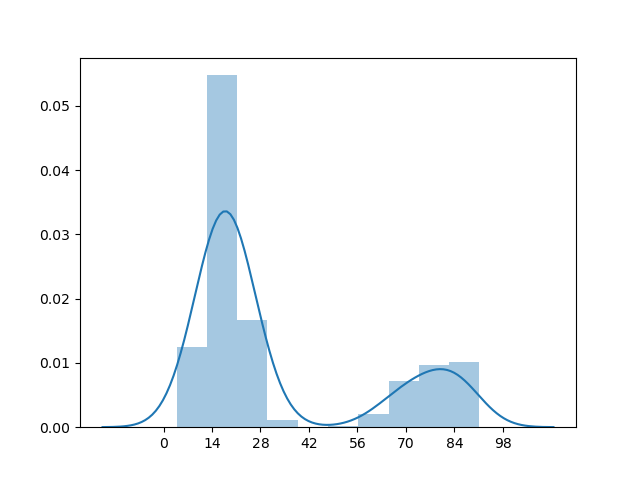

In [310]:
plt.close()
p = np.array(muscle_df_ref)
indices = np.triu_indices_from(muscle_df_ref, k =1)
A = np.asarray( p[indices] )
len(A)

sns.distplot(A)
plt.xticks(range(0, 101, 14))
plt.show()

In [110]:
## In the above figure about 80% of the dataset have sequence similarity above 15%.

21.62962962962963

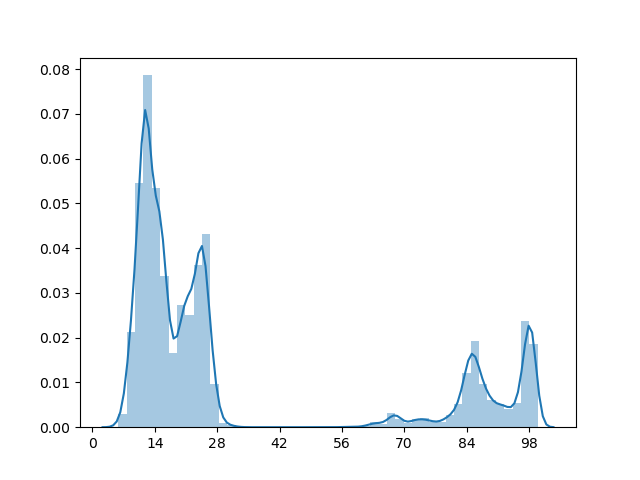

In [50]:
plt.close()
p = np.array(muscle_df_all)
indices = np.triu_indices_from(muscle_df_all, k =1)
A = np.asarray( p[indices] )
len(A)

sns.distplot(A)
plt.xticks(range(0, 101, 14))
plt.show()

In [382]:
from scipy.cluster import hierarchy


plt.close('all')

def calculate_distance_matrix(symm_matrix, custom_order):
    
    if custom_order == 'yes':
    # computer upper triu matrix without diagonal into a condensed 1-D array, input either sorted or unsorted symmetric matrix
    
    # Sort index and columns in ascending order
    # Reindex the DataFrame based on custom order
        custom_column_order = [f'sequence_{x}' for x in sorted([int(i.split('_')[1]) for i in symm_matrix.index])]

        symm_mat_sorted = symm_matrix.reindex(index=custom_column_order, columns=custom_column_order)
        symm_mat_sorted

        df = symm_mat_sorted.where(np.triu(np.ones(symm_mat_sorted.shape), k = 1).astype(bool))
        df = df.stack().reset_index()
        df.index = [x+'_'+y for x, y in zip(df['level_0'], df['level_1'])]
        df = df[[0]].rename(columns={0: 'values'})
        df = df.apply(lambda x: 1 - x*0.01)
        return df, custom_column_order
    
    elif custom_order=='no':
        
        symm_mat_sorted = symm_matrix
        df = symm_mat_sorted.where(np.triu(np.ones(symm_mat_sorted.shape), k = 1).astype(bool))
        df = df.stack().reset_index()
        df.index = [x+'_'+y for x, y in zip(df['level_0'], df['level_1'])]
        df = df[[0]].rename(columns={0: 'values'})
        df = df.apply(lambda x: 1 - x*0.01)
        return df
    
    
def cmap_radialtree(Z2, dendrogram_df):
    
    ucolors = sorted(set(Z2["color_list"]))
    cmp = plt.cm.get_cmap('gist_rainbow', len(ucolors))
    # print(cmp)
    if type(cmp) == matplotlib.colors.LinearSegmentedColormap:
        cmap = cmp(np.linspace(0, 1, len(ucolors)))
    else:
        cmap = cmp.colors

    cmap_rgba = {}
    nlabels = 0
    for icoord, dcoord, c in sorted(zip(Z2["icoord"], Z2["dcoord"], Z2["color_list"])):
        # x, y = Z2_ref_uniprot['icoord'][0], Z2_ref_uniprot['dcoord'][0]
        _color = cmap[ucolors.index(c)]
    #     print(c, _color)
        cmap_rgba.update({c: _color})

    rgba_ = []
    for c in dendrogram_df['color_code']:
        if c == 'C0':
            rgba_.append('black')
        else:
            rgba_.append(cmap_rgba[c])
    dendrogram_df['rgba'] = rgba_
    return dendrogram_df

## This is a mapping for annotations that will be used later.

In [53]:
cd_dict = {}
# based on CD-hit clustering, create a dict with {seq_id-cluster id : [seq1, seq2, ...,seqN], cluster X: []}

num = 0 # this number tells about how many sequences are updated in dict
for i in reference_df.index:
#     print(reference_df.iloc[i][['cluster_id', 'sequence_id']])
#     print(i)
    
    cid = reference_df.iloc[i]['cluster_id']
#     print(cid)
    if cid in list(clusters_dict.keys()):
#         print(cid)
        kname = format(reference_df.iloc[i]['cluster_id'])+'-'+format(reference_df.iloc[i]['sequence_id'])
        cd_dict.update({kname: [format(reference_df.iloc[i]['sequence_id'])]+[f'sequence_{x}' for x in clusters_dict[cid]['sequence_id']]})
#         cd_dict.update({format(reference_df.iloc[i]['sequence_id']): [format(reference_df.iloc[i]['sequence_id'])]+[f'sequence_{x}' for x in clusters_dict[cid]['sequence_id']]})
#         print(len([f'sequence_{x}' for x in clusters_dict[cid]['sequence_id']]))
        num += len([format(reference_df.iloc[i]['sequence_id'])]+[f'sequence_{x}' for x in clusters_dict[cid]['sequence_id']])
    elif not cid in list(clusters_dict.keys()):
#         print(cid)
#         print(reference_df.iloc[i]['sequence_id'])
        kname = format(reference_df.iloc[i]['cluster_id'])+'-'+format(reference_df.iloc[i]['sequence_id'])
        cd_dict.update({kname: [str(reference_df.iloc[i]['sequence_id'])]})
#         cd_dict.update({format(reference_df.iloc[i]['sequence_id']): [fstr(reference_df.iloc[i]['sequence_id'])]})
#         print(len([fstr(reference_df.iloc[i]['sequence_id'])]))
        num +=len([str(reference_df.iloc[i]['sequence_id'])])
    else:
        print(i)
# print(num)
cluster_mapping = sorted([y+'-'+x for x, a in cd_dict.items() for y in a])
# print(len(cluster_mapping))
# print(cluster_mapping[:10])


type_num = len(cd_dict.keys())  # total number of clusters by CD-HIT
# print(type_num)

cluster_mapping_ordered = {}
cluster_mapping_ordered_seq = {}
for x in sorted_muscle_df.index:
    for a in cluster_mapping:
        a1 = a.split('-')[0]
        a2 = a.split('-')[1]
        a3 = a.split('-')[2]
#         print(a1, x)

        if a1 == x:
#             print(a1, a2, x)
            cluster_mapping_ordered.update({a1: a2})
            cluster_mapping_ordered_seq.update({a2: a3})
orphan = [i.split('-')[0] for i in cd_dict.keys() if len(cd_dict[i]) < 2]   # orphan-sequences (which weren't assigned to any clusters)
# orphan
type_num = type_num - len(orphan)
# print(orphan)
print(type_num) # so total unique clusters come out to be 23 without orphan sequences

type_list = {j: j for i, j in zip(range(1, type_num+1), [x.split('-')[0] for x in cd_dict.keys() if not x in orphan])} 
type_list.update({j: "cluster X" for j in orphan})  # assign cluster X for orphan
# print(type_list)

colors_mapping = [type_list[i] for i in cluster_mapping_ordered.values()]
# print(colors_mapping)

sample_classes = {
    "cluster (≥ 90%)": colors_mapping
    
}

cmap_411 = {i : [cluster_mapping_ordered_seq[i], dendrogram_df[dendrogram_df['query_title'] == cluster_mapping_ordered_seq[i]]['rgba'].values[0], 
                 dendrogram_df[dendrogram_df['query_title'] == cluster_mapping_ordered_seq[i]]['protein_name'].values[0], 
                dendrogram_df[dendrogram_df['query_title'] == cluster_mapping_ordered_seq[i]]['sciname'].values[0]] for i in  cluster_mapping_ordered.values()}


protein_mapping = [cmap_411[cluster_mapping_ordered[s]][2] for s in cluster_mapping_ordered.keys()]
species_mapping =  [cmap_411[cluster_mapping_ordered[s]][3] for s in cluster_mapping_ordered.keys()]
sample_classes_411 = {
    "protein": protein_mapping,
    "species": species_mapping
}

23


# RADIALTREE

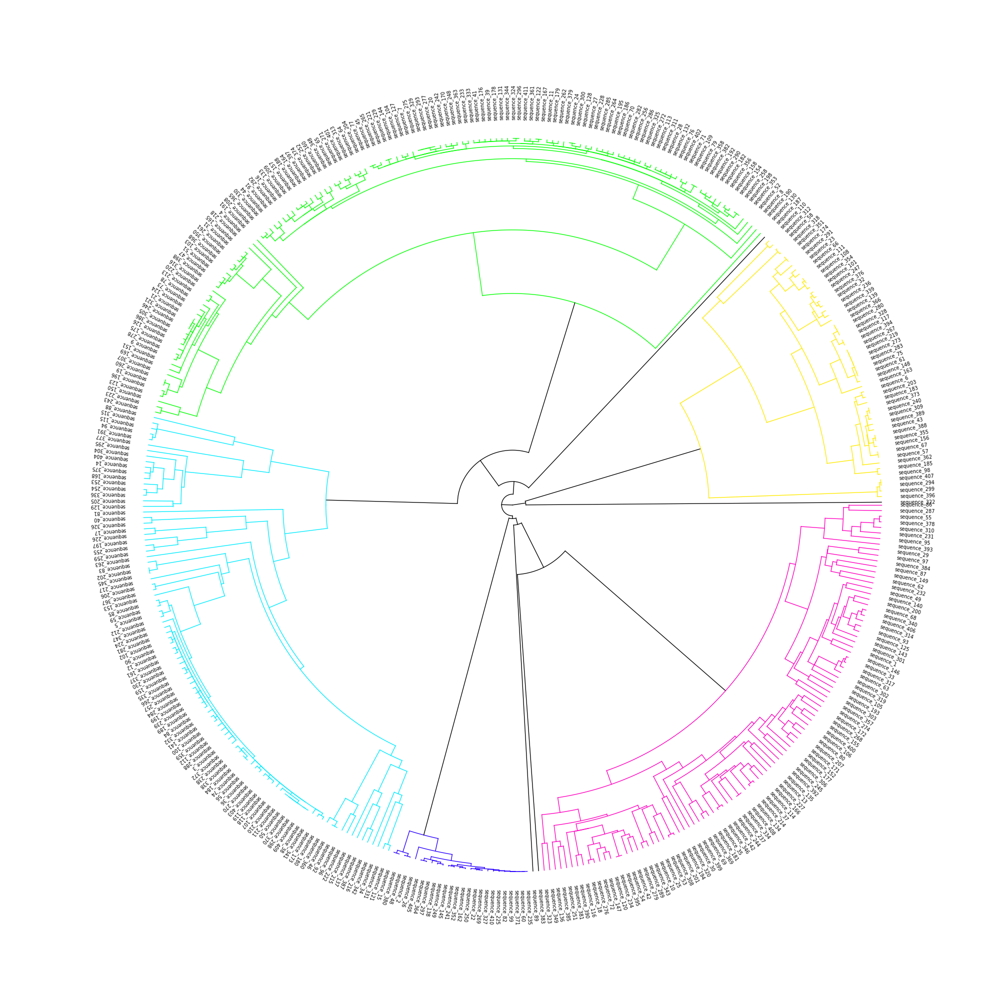

Total execution time: 0 mins 2.32 secs


In [389]:
@measure
def radial_tree_all(muscle_df_all, sample_classes):
    plt.close()
    
    indices_all = ['sequence_'+format(i) for i in range(1, 412)]

    # # indices
    sorted_muscle_df =  muscle_df_all.loc[indices_all, indices_all]

    distance_mat = calculate_distance_matrix(sorted_muscle_df, 'no')
    
    Y = hierarchy.linkage(distance_mat['values'], method='complete') 
    Z2 = sch.dendrogram(Y, labels=muscle_df_all.index, no_plot=True)
    
    # for colormapping
#     big_dendrogram_df = pd.DataFrame([Z2['leaves_color_list'], # leaves colorcode list
#               Z2['ivl'],               # leaves original name
#              [int(x.split('_')[1]) for x in Z2['ivl']],  # query sequence id
#              ]).T

#     big_dendrogram_df.columns = ['color_code', 'query_title', 'accession']
#     # print(big_dendrogram_df)


#     big_dendrogram = cmap_radialtree(Z2, big_dendrogram_df)
    # print(big_dendrogram)
    

    fig, ax = plt.subplots(figsize=(20, 20))

    radialTreee(Z2, ax=ax, sample_classes=sample_classes)

    plt.show()
    
radial_tree_all(muscle_df_all, sample_classes=None)
# plt.savefig(output_dir+'radialtree.png', dpi=300, bbox_inches='tight')

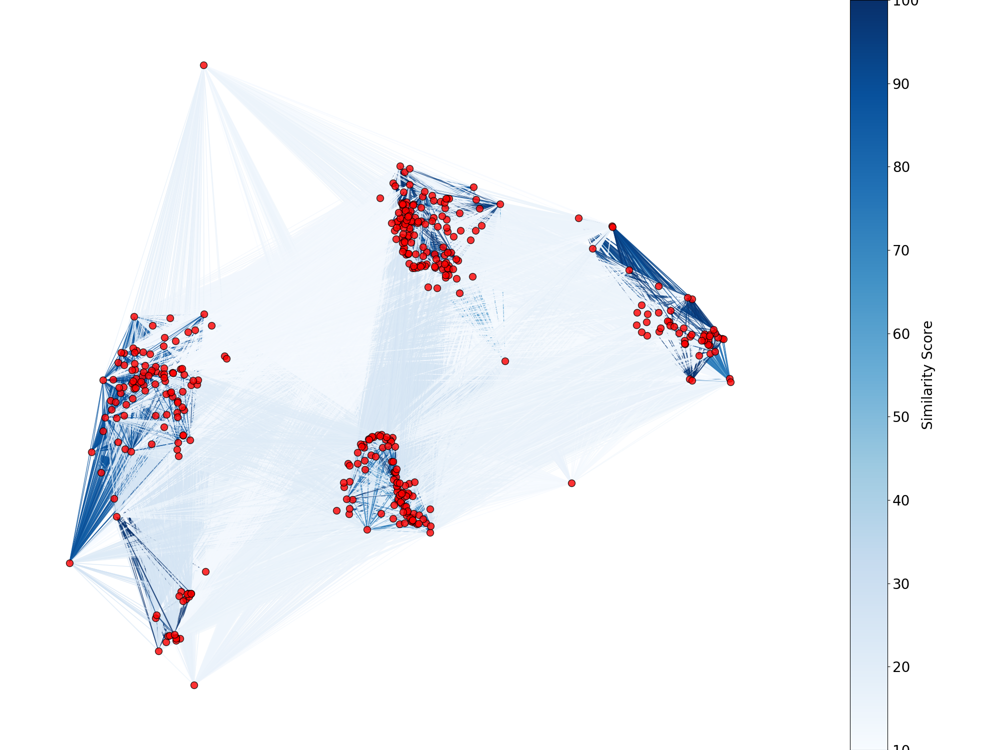

Total execution time: 0 mins 13.71 secs


In [98]:
import networkx as nx
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1 import make_axes_locatable

plt.close('all')

@measure
def nx_1(sorted_muscle_df):
    plt.close('all')


    # Draw the network
    plt.figure(figsize=(20, 15))  # Adjust width and height as needed
    G = nx.Graph()
    # threshold = 15
    # Add nodes to the graph

    # # Define minimum and maximum threshold values
    min_threshold = 10
    max_threshold = 100

    num_proteins = sorted_muscle_df.shape[0]
    for i in range(num_proteins):
        G.add_node(i)

    # Add edges to the graph based on similarity scores
    for i in range(num_proteins):
        for j in range(i + 1, num_proteins):
            similarity_score = sorted_muscle_df.iloc[i, j]
            if min_threshold <= similarity_score <= max_threshold:  # Only add edges within the range
    #             print(i, j, similarity_score)
                G.add_edge(i, j, weight=similarity_score)
    #         if similarity_score > threshold:  # Set your threshold here
    #             G.add_edge(i, j, weight=similarity_score)
    # # Draw the network
    pos = nx.spring_layout(G)  # Position nodes using the spring layout algorithm

    # Get edge weights
    edge_weights = nx.get_edge_attributes(G, 'weight').values()

    # Define colormap and normalize it
    cmap = plt.cm.Blues  # Choose your colormap
    norm = mcolors.Normalize(vmin=min(edge_weights), vmax=max(edge_weights))

    
    # # Draw edges with weights and colorbar
    nx.draw(G, pos, with_labels=False, node_color='red', node_size=100,
            edge_color=edge_weights, width=1, edge_cmap=cmap, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights), alpha=0.8, edgecolors='black')
    
    
     # Change the size of the color bar
    divider = make_axes_locatable(plt.gca())
#     cax = divider.append_axes("right", size="5%", pad=0.05)  # Adjust the size as needed
#     cbar = plt.colorbar(mappable=plt.cm.ScalarMappable(norm=norm, cmap=cmap), cax=cax)
    
    cbar = plt.colorbar(mappable=plt.cm.ScalarMappable(norm=norm, cmap=cmap))
    cbar.set_label('Similarity Score', fontsize=20)
    cbar.ax.tick_params(labelsize=20)
    
    plt.title("Protein Similarity Network", fontsize=25)
    plt.show()
    
nx_1(sorted_muscle_df)
# plt.savefig(output_dir+'Network_graph.png', dpi=100, bbox_inches='tight')

# Tree of reference sequences

In [85]:
cbar = plt.colorbar(mappable=plt.cm.ScalarMappable(norm=norm, cmap=cmap), fraction=0.046, pad=0.01)

In [55]:
distance_mat_ref, custom_order_ref = calculate_distance_matrix(muscle_df_ref, 'yes')
distance_mat_ref

,values
sequence_3_sequence_10,0.3493
sequence_3_sequence_13,0.3425
sequence_3_sequence_15,0.3586
sequence_3_sequence_17,0.7329
sequence_3_sequence_20,0.7172
...,...
sequence_349_sequence_390,0.8500
sequence_349_sequence_407,0.8686
sequence_384_sequence_390,0.2877
sequence_384_sequence_407,0.8194


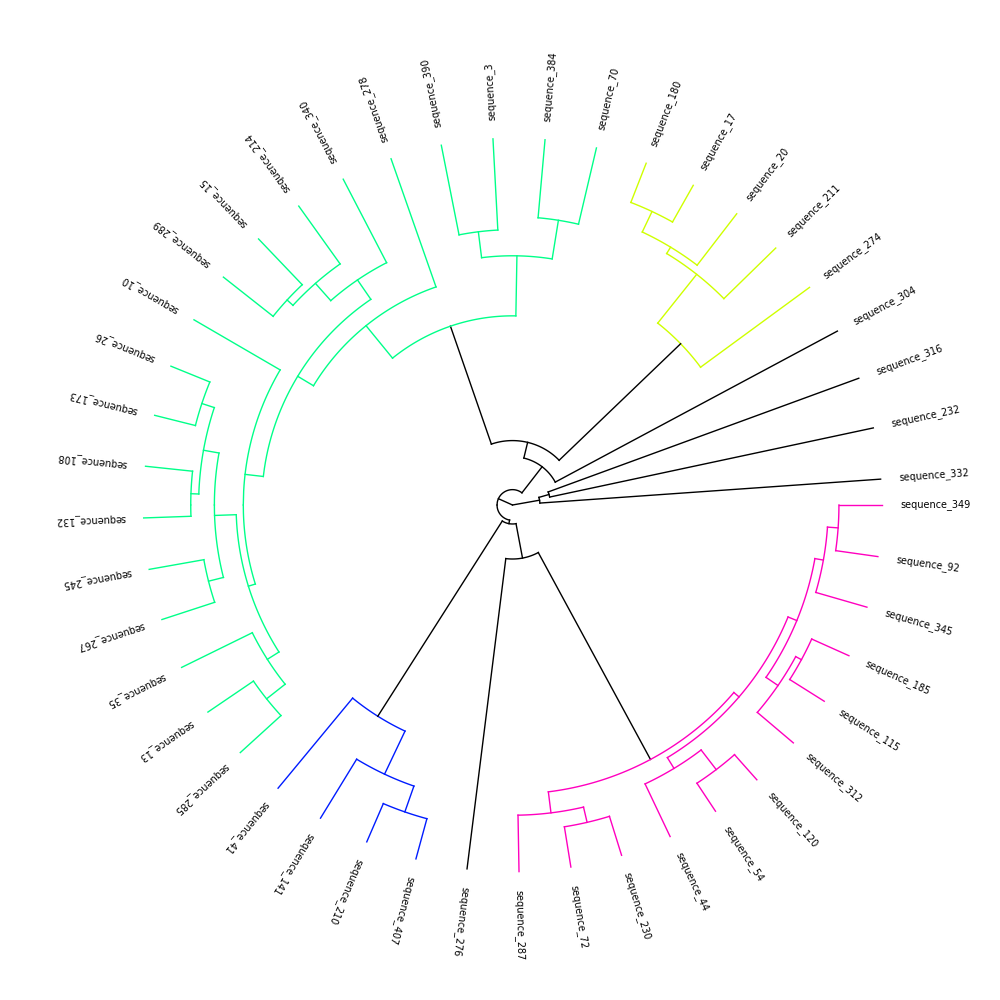

In [392]:
plt.close()
Y_ref = hierarchy.linkage(distance_mat_ref['values'], method='complete')  # complete clusters the farthest points (closest similarity)
# print(Y_ref)

Z2_ref = sch.dendrogram(Y_ref, labels=custom_order_ref, no_plot=True)
fig, ax = plt.subplots(figsize=(10, 10))
radialTreee(Z2_ref, ax=ax)

plt.show()

## BLAST output of 45 sequences

In [57]:
blast_path = input_dir+'BLAST_output\\proteins_45\\'
main_blast_job = pd.read_json(blast_path+'0GA5FXSX01N.json')
blast_ids_list = [x['File'] for x in main_blast_job['BlastJSON']]
# blast_ids_list

# # HSPs (high-scoring segment pairs)
# ‘bit score’: score (in bits) of HSP (float);
# ‘evalue’: e-value of HSP (float);
# ‘identity’: number of identities in HSP (integer);
# ‘positive’: number of positives in HSP (integer);
# ‘gaps’: number of gaps in HSP (integer);
# ‘midline’: formating middle line.

# for i in blast_ids_list:
#     try:
#         with open(blast_path+i) as f:
#             data = json.load(f)
#             hits_dict = data['BlastOutput2']['report']['results']['search']['hits']                    # data about hits
#             query_title = data['BlastOutput2']['report']['results']['search']['query_title']           # original fasta id from query: query title
#             query_len = data['BlastOutput2']['report']['results']['search']['query_len']               # original length of sequence from query
# #             print(query_title)
#     #         print(hits_dict)
#             params = []
#             for x in hits_dict:
#     #             params.append()
#     #             print(x['num'])
#                 description = pd.Series(x['description'][0])
#                 description['num'] = x['num']
#                 description['len'] = x['len']
#     #             print(description)
#                 hsps = pd.Series(x['hsps'][0])
#     #             print(hsps)
#                 combined = pd.concat([description, hsps])
#     #             print(combined)
#                 params.append(combined)
#     #         print(len(params))
#     #         print(params[0])
#             params_df = pd.concat(params, axis=1).T
#             params_df['query_title'] = [query_title for z in range(len(params_df.index))]
#             params_df['query_len'] = [query_len for z in range(len(params_df.index))]
# #             print(params_df['query_title'])
#             params_df.to_csv(blast_path+i.split('.')[0]+'.csv')
#     except:
#         print(i, 'DOESNT EXIST')
#         pass
    
top_hits = []

for item in os.listdir(blast_path):
    if item.endswith('.csv'):
#         print(item)
        blast_info = pd.read_csv(blast_path+item.split('.')[0]+'.csv', index_col=0)
        top_hits.append(blast_info.iloc[0])
        
top_hits_df = pd.concat(top_hits, axis=1).T
top_hits_df.index = range(1, len(top_hits)+1)
top_hits_df

,id,accession,title,taxid,sciname,num,len,num.1,bit_score,score,...,query_to,hit_from,hit_to,align_len,gaps,qseq,hseq,midline,query_title,query_len
1,sp|P02123.1|,P02123,RecName: Full=Hemoglobin subunit beta; AltName...,8801,Struthio camelus,1,146,1,291.582,745,...,146,1,146,146,0,VQWSAEEKQLISSLWGKVNVAECGAEALARLLIVYPWTQRFFTSFG...,VQWSAEEKQLISGLWGKVNVADCGAEALARLLIVYPWTQRFFASFG...,VQWSAEEKQLIS LWGKVNVA+CGAEALARLLIVYPWTQRFF SFG...,sequence_3,146
2,sp|P0DOX8.1|,P0DOX8,RecName: Full=Immunoglobulin lambda-1 light ch...,9606,Homo sapiens,1,216,1,359.377,921,...,216,1,216,217,2,QSVLTQPPSASGTPGQRVTISCSGSSSNIG-ENSVTWYQHLSGTAP...,QSALTQPPSASGSLGQSVTISCTGTSSDVGGYNYVSWYQQHAGKAP...,QS LTQPPSASG+ GQ VTISC+G+SS++G N V+WYQ +G AP...,sequence_44,216
3,sp|P0DOX8.1|,P0DOX8,RecName: Full=Immunoglobulin lambda-1 light ch...,9606,Homo sapiens,1,216,1,350.132,897,...,217,1,216,217,1,QSVLTQPPSVSGAPGQRVTISCTGSSSNIGAGYAVHWYQQLPGTAP...,QSALTQPPSASGSLGQSVTISCTGTSSDVGGYNYVSWYQQHAGKAP...,QS LTQPPS SG+ GQ VTISCTG+SS++G V WYQQ G AP...,sequence_54,220
4,sp|P61921.2|,P61921,RecName: Full=Hemoglobin subunit gamma-2; AltN...,9598,Pan troglodytes,1,147,1,301.212,770,...,147,2,147,146,0,GHFTEEDKATITSLWGKVNVEDAGGETLGRLLVVYPWTQRFFDSFG...,GHFTEEDKATITSLWGKVNVEDAGGETLGRLLVVYPWTQRFFDSFG...,GHFTEEDKATITSLWGKVNVEDAGGETLGRLLVVYPWTQRFFDSFG...,sequence_70,147
5,sp|P0DOX8.1|,P0DOX8,RecName: Full=Immunoglobulin lambda-1 light ch...,9606,Homo sapiens,1,216,1,406.371,1043,...,217,1,216,217,1,QSALTQPPSGSGSPGQSVTISCTGTSSDVGGYKYVSWYQQHPGKAP...,QSALTQPPSASGSLGQSVTISCTGTSSDVGGYNYVSWYQQHAGKAP...,QSALTQPPS SGS GQSVTISCTGTSSDVGGY YVSWYQQH GKAP...,sequence_72,217
6,sp|P0DOX8.1|,P0DOX8,RecName: Full=Immunoglobulin lambda-1 light ch...,9606,Homo sapiens,1,216,1,350.903,899,...,216,1,216,217,2,QSVLTQPPSVSAAPGQKVTISCSGNNSNIG-KNYVSWYQQLPGRTP...,QSALTQPPSASGSLGQSVTISCTGTSSDVGGYNYVSWYQQHAGKAP...,QS LTQPPS S + GQ VTISC+G +S++G NYVSWYQQ G+ P...,sequence_92,216
7,sp|P68011.1|,P68011,RecName: Full=Hemoglobin subunit beta; AltName...,29073,Ursus maritimus,1,146,1,280.026,715,...,146,1,146,146,0,VHLTAEEKAHVSGLWGKVNTEEVGGEALGRLLVVYPWTQRFFETFG...,VHLTGEEKSLVTGLWGKVNVDEVGGEALGRLLVVYPWTQRFFDSFG...,VHLT EEK+ V+GLWGKVN +EVGGEALGRLLVVYPWTQRFF++FG...,sequence_108,146
8,sp|P0DOX8.1|,P0DOX8,RecName: Full=Immunoglobulin lambda-1 light ch...,9606,Homo sapiens,1,216,1,350.517,898,...,243,1,216,219,4,QSVLTQPPSASGTPGQRVTISCSGSSSNIGT-NTVNWYQQLPGTAP...,QSALTQPPSASGSLGQSVTISCTGTSSDVGGYNYVSWYQQHAGKAP...,QS LTQPPSASG+ GQ VTISC+G+SS++G N V+WYQQ G AP...,sequence_115,243
9,sp|P0DOX8.1|,P0DOX8,RecName: Full=Immunoglobulin lambda-1 light ch...,9606,Homo sapiens,1,216,1,354.369,908,...,245,1,216,218,3,QSVLTQPPSVSGAPGQRVTISCSGSRSNIGS-NTVKWYQQLPGTAP...,QSALTQPPSASGSLGQSVTISCTGTSSDVGGYNYVSWYQQHAGKAP...,QS LTQPPS SG+ GQ VTISC+G+ S++G N V WYQQ G AP...,sequence_120,245
10,sp|P60524.1|,P60524,RecName: Full=Hemoglobin subunit beta; AltName...,9615,Canis lupus familiaris,1,146,1,295.434,755,...,146,1,146,146,0,VHLTAEEKSLVSGLWAKVNVDEVGGEALGRLLIVYPWTQRFFDSFG...,VHLTAEEKSLVSGLWGKVNVDEVGGEALGRLLIVYPWTQRFFDSFG...,VHLTAEEKSLVSGLW KVNVDEVGGEALGRLLIVYPWTQRFFDSFG...,sequence_132,146


In [58]:
# since there are 45 ids total: but one of them has no hits, so I add 'No hits term'
uniprot_ref_mapping = {y: f'{y}: {x}' for x, y in zip(top_hits_df['accession'], top_hits_df['query_title'])}
# print(uniprot_ref_mapping)

# add the extra sequence_id for which no hits found
for x in [o for o in reference_df['sequence_id']]:
#     print(x)
    if not x in uniprot_ref_mapping.keys():
#         print(x)
        uniprot_ref_mapping.update({x: f'{x}: No hits'})
# print(uniprot_ref_mapping)

muscle_df_ref_uniprot = muscle_df_ref.copy()
muscle_df_ref_uniprot.rename(index= uniprot_ref_mapping, columns=uniprot_ref_mapping, inplace=True)
# muscle_df_ref_uniprot
distance_mat_ref_uniprot = calculate_distance_matrix(muscle_df_ref_uniprot, custom_order='no')
distance_mat_ref_uniprot

,values
sequence_316: No hits_sequence_41: Q9QBZ5,0.8993
sequence_316: No hits_sequence_407: P12497,0.8921
sequence_316: No hits_sequence_141: P12497,0.8921
sequence_316: No hits_sequence_210: P12497,0.8716
sequence_316: No hits_sequence_232: P08083,0.8630
...,...
sequence_115: P0DOX8_sequence_287: P0DOX8,0.1830
sequence_115: P0DOX8_sequence_54: P0DOX8,0.0926
sequence_120: P0DOX8_sequence_287: P0DOX8,0.1745
sequence_120: P0DOX8_sequence_54: P0DOX8,0.0880


## look at a pairwise local alignment

In [59]:
colorprint(reference_df[reference_df['sequence_id'] == 'sequence_54']['sequence'].values[0], 'red')
colorprint(reference_df[reference_df['sequence_id'] == 'sequence_120']['sequence'].values[0], 'blue')
aln= pairwise2.align.localxx(reference_df[reference_df['sequence_id'] == 'sequence_54']['sequence'].values[0], reference_df[reference_df['sequence_id'] == 'sequence_120']['sequence'].values[0])
print('ALIGNMENT')
colorprint(aln[0].seqA, 'red')
colorprint(aln[0].seqB, 'blue')

print(sorted_muscle_df.loc['sequence_54']['sequence_120'])

QSVLTQPPSVSGAPGQRVTISCTGSSSNIGAGYAVHWYQQLPGTAPKLLISGNSNRPSGVPDRFSGSKSGTSASLAITGLQAEDEADYYCQSYDSSLSGSVFGGGTKLTVLGQPKAAPSVTLFPPSSEELQANKATLVCLISDFYPGAVTVAWKADSSPVKAGVETTTPSKQSNNKYAASSYLSLTPEQWKSHRSYSCQVTHEGSTVEKTVAPTECSARQ
MGILPSPGMPALLSLVSLLSVLLMGCVAQSVLTQPPSVSGAPGQRVTISCSGSRSNIGSNTVKWYQQLPGTAPKLLIYYNDQRPSGVPDRFSGSKSGTSASLAITGLQAEDEADYYCQSYDRYTHPALLFGTGTKVTVLGQPKAAPSVTLFPPSSEELQANKATLVCLISDFYPGAVTVAWKADSSPVKAGVETTTPSKQSNNKYAASSYLSLTPEQWKSHRSYSCQVTHEGSTVEKTVAPTECS
ALIGNMENT
----------------------------QSVLTQPPSVSGAPGQRVTISCTGS-S-SNIGAGYA---VH-WYQQLPGTAPKLLISGNS--N--RPSGVPDRFSGSKSGTSASLAITGLQAEDEADYYCQSYDSS------LSGSV-FGG-GTKL-TVLGQPKAAPSVTLFPPSSEELQANKATLVCLISDFYPGAVTVAWKADSSPVKAGVETTTPSKQSNNKYAASSYLSLTPEQWKSHRSYSCQVTHEGSTVEKTVAPTECSARQ
MGILPSPGMPALLSLVSLLSVLLMGCVAQSVLTQPPSVSGAPGQRVTISC--SGSRSNI--G--SNTV-KWYQQLPGTAPKLLI----YYNDQRPSGVPDRFSGSKSGTSASLAITGLQAEDEADYYCQSYD--RYTHPAL----LF-GTGTK-VTVLGQPKAAPSVTLFPPSSEELQANKATLVCLISDFYPGAVTVAWKADSSPVKAGVETTTPSKQSNNKYAASSYLSLTPEQWKSHRSYSCQVTHEGSTVE

In [85]:
# distance_mat_ref_uniprot

In [62]:
plt.close()
Y_ref_uniprot = hierarchy.linkage(distance_mat_ref_uniprot['values'], method='complete')  # complete clusters the farthest points (closest similarity)
# print(Y_ref_uniprot)

Z2_ref_uniprot = sch.dendrogram(Y_ref_uniprot, labels=muscle_df_ref_uniprot.index, no_plot=True)
# Z2_ref_uniprot

dendrogram_df = pd.DataFrame([Z2_ref_uniprot['leaves_color_list'], # leaves colorcode list
              Z2_ref_uniprot['ivl'],               # leaves original namE
             [x.split(':')[0] for x in Z2_ref_uniprot['ivl']],  # query sequence id
              [x.split(':')[1] for x in Z2_ref_uniprot['ivl']],   # query uniprot id
             ]).T

dendrogram_df.columns = ['color_code', 'qname', 'query_title', 'accession']
ucolors = sorted(set(Z2_ref_uniprot["color_list"]))
# cmap = plt.cm.gist_rainbow(np.linspace(0, 1, len(ucolors)))
cmp = plt.cm.get_cmap('gist_rainbow', len(ucolors))
# print(cmp)
if type(cmp) == matplotlib.colors.LinearSegmentedColormap:
    cmap = cmp(np.linspace(0, 1, len(ucolors)))
else:
    cmap = cmp.colors

cmap_rgba = {}
nlabels = 0
for icoord, dcoord, c in sorted(zip(Z2_ref_uniprot["icoord"], Z2_ref_uniprot["dcoord"], Z2_ref_uniprot["color_list"])):
    # x, y = Z2_ref_uniprot['icoord'][0], Z2_ref_uniprot['dcoord'][0]
    _color = cmap[ucolors.index(c)]
#     print(c, _color)
    cmap_rgba.update({c: _color})
    
rgba_ = []
for c in dendrogram_df['color_code']:
    if c == 'C0':
        rgba_.append('black')
    else:
        rgba_.append(cmap_rgba[c])
dendrogram_df['rgba'] = rgba_

In [63]:
sciname_list = []
protein = []
n= 0
for a, b in zip(dendrogram_df['query_title'], dendrogram_df['accession']):
    title = top_hits_df[top_hits_df['query_title']==a]['title'].values
    sciname = top_hits_df[top_hits_df['query_title']==a]['sciname'].values
#     print(a, title)
    if len(title) == 0:
#         print(a, title)
        n += 1
        sciname_list.append('None')
        protein.append('None')
    elif not len(title) == 0:
        sciname_list.append(sciname[0])
        if ';' in title[0]:
            protein_name = [x.split('=')[1] for x in title[0].split(';') if x.startswith('RecName')][0]
            protein.append(protein_name)
#             print()
        elif not ';' in title[0]:
            protein_name = title[0].split('[')[0].split('=')[1]
            protein.append(protein_name)
            
dendrogram_df['protein_name'] = protein
dendrogram_df['sciname'] = sciname_list
print(dendrogram_df.head())

  color_code                  qname   query_title accession  \
0         C0   sequence_332: P0DTC2  sequence_332    P0DTC2   
1         C0  sequence_316: No hits  sequence_316   No hits   
2         C0   sequence_232: P08083  sequence_232    P08083   
3         C0   sequence_304: O58677  sequence_304    O58677   
4         C1   sequence_274: P56208  sequence_274    P56208   

                                  rgba                       protein_name  \
0                                black                 Spike glycoprotein   
1                                black                               None   
2                                black                         Colicin-N    
3                                black  Ribulose bisphosphate carboxylase   
4  [0.8108108108108109, 1.0, 0.0, 1.0]                         Myoglobin    

                                           sciname  
0  Severe acute respiratory syndrome coronavirus 2  
1                                             None  

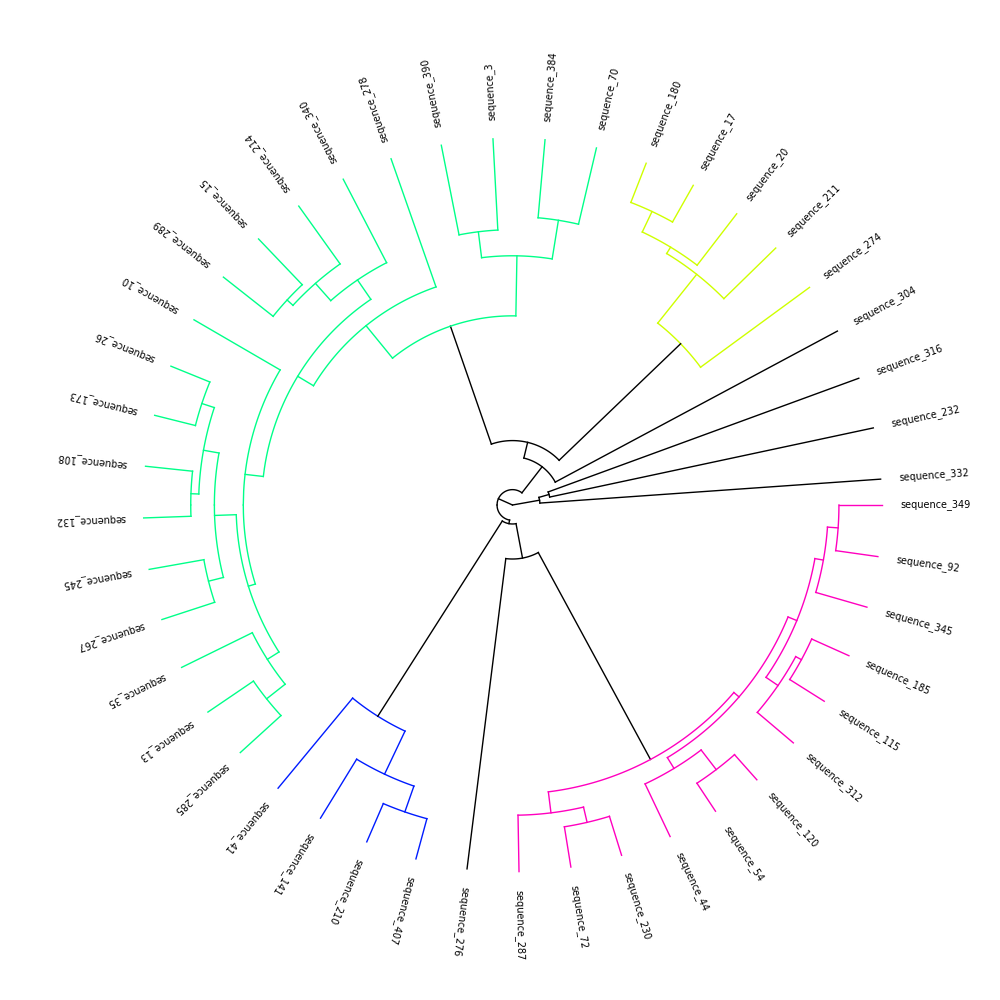

In [393]:
plt.close()
Y_ref = hierarchy.linkage(distance_mat_ref['values'], method='complete')  # complete clusters the farthest points (closest similarity)
# print(Y_ref)

Z2_ref = sch.dendrogram(Y_ref, labels=custom_order_ref, no_plot=True)
fig, ax = plt.subplots(figsize=(10, 10))
radialTreee(Z2_ref, ax=ax)

plt.show()


<ipython-input-37-fbb105e182af>:225: RuntimeWarning: invalid value encountered in sqrt
  link = np.sqrt(r[1] ** 2 - np.linspace(_xr1, _r, 100) ** 2)
<ipython-input-37-fbb105e182af>:227: RuntimeWarning: invalid value encountered in sqrt
  link = -np.sqrt(r[1] ** 2 - np.linspace(_r, _xr2, 100) ** 2)


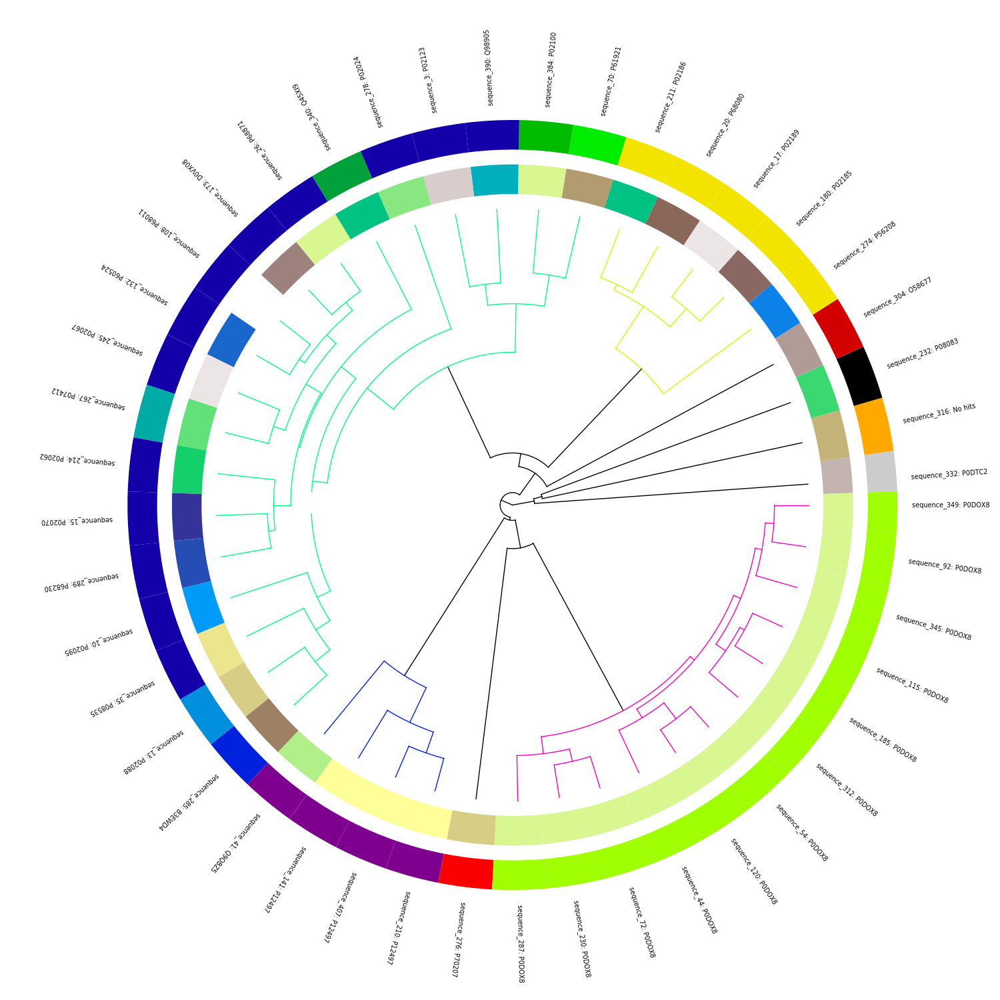

In [398]:

plt.close('all')
fig, ax = plt.subplots(figsize=(15, 15))
sample_classes_45 = {
    "protein": [dendrogram_df[dendrogram_df['qname'] == i]['protein_name'].values[0] for i in muscle_df_ref_uniprot.index],
    "species": [dendrogram_df[dendrogram_df['qname'] == i]['sciname'].values[0] for i in muscle_df_ref_uniprot.index],
}
radialTreee(Z2_ref_uniprot, ax=ax, sample_classes=sample_classes_45)

# plt.savefig(input_dir+'cd_hit_uniprot_classes.png', dpi=300, bbox_inches='tight')
plt.show()

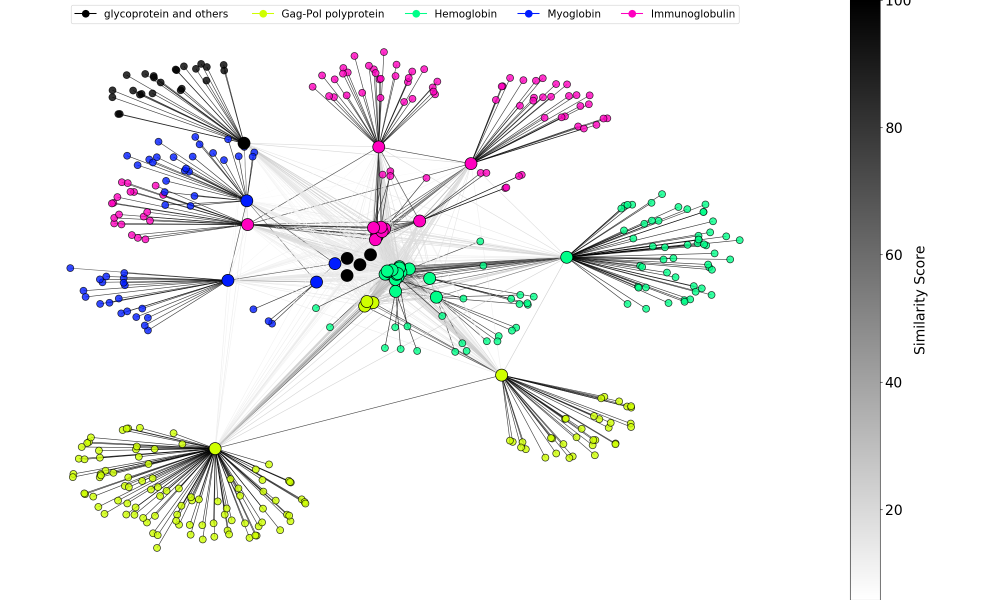

In [477]:
import networkx as nx
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

plt.close('all')

# sorted_muscle_df = sorted_muscle_df.apply(lambda x)
# Create a graph

# Draw the network
plt.figure(figsize=(20, 12))  # Adjust width and height as needed
G = nx.Graph()
# threshold = 15
# Add nodes to the graph

# # Define minimum and maximum threshold values
min_threshold = 1
max_threshold = 100

num_proteins = sorted_muscle_df.shape[0]
for i in range(num_proteins):
    G.add_node(i)

# PARENT ---------------------------------------------------------
            
# Add edges to the graph based on similarity scores
for i in range(num_proteins):
    for j in range(i + 1, num_proteins):
        
        i_ref = 'sequence_'+str(i + 1)
        j_ref = 'sequence_'+str(j + 1)
        if i_ref in list(reference_df['sequence_id']):
            if j_ref in list(reference_df['sequence_id']):
#                 print(i_ref, j_ref)
                similarity_score = sorted_muscle_df.loc[i_ref][j_ref]
#                 print(i_ref, j_ref, similarity_score)
                if min_threshold <= similarity_score <= max_threshold:  # Only add edges within the range
                    G.add_edge(i, j, weight=similarity_score)
                
ref_colormap = {}
for i in range(num_proteins):
#     print('sequence_'+str(i+1))
    ref = 'sequence_'+str(i+1)
    if ref in list(dendrogram_df['query_title']):
#         print(i)
#         print(i, ref, dendrogram_df[dendrogram_df['query_title'] == ref]['leaf_color'].values[0])
        ref_colormap.update({i: dendrogram_df[dendrogram_df['query_title'] == ref]['rgba'].values[0]})
    
    
    
# CHILD --------------------------------------------------------------

child_colormap = {}

for x, y in cd_dict.items():
#     print(x, y)
    x = x.split('-')[0]
    ref_ind = int(reference_df[reference_df['cluster_id'] == x]['sequence_id'].values[0].split('_')[1]) - 1
    for item in y:
        child_ind = int(item.split('_')[1])-1
        if not child_ind == ref_ind:
#             print(ref_ind, child_ind)
            child_colormap.update({child_ind: ref_colormap[ref_ind]})
            similarity_score_child = sorted_muscle_df.iloc[ref_ind, child_ind]
            if min_threshold <= similarity_score_child <= max_threshold:  # Only add edges within the range
                G.add_edge(ref_ind, child_ind, weight=similarity_score_child)
                
full_colormap = {}
full_colormap.update(ref_colormap)
full_colormap.update(child_colormap)

sorted_colormap = {i: full_colormap[i] for i in range(num_proteins)}

# DRAW''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''

pos = nx.spring_layout(G)  # Position nodes using the spring layout algorithm

# Get edge weights
edge_weights = nx.get_edge_attributes(G, 'weight').values()

# Define colormap and normalize it
cmap = plt.cm.binary  # Choose your colormap
norm = mcolors.Normalize(vmin=min(edge_weights), vmax=max(edge_weights))

# # Draw edges with weights and colorbar
nx.draw(G, pos, with_labels=False, node_size=100, nodelist=sorted_colormap.keys(), node_color=list(sorted_colormap.values()), 
        edge_color=edge_weights, width=0.9, edge_cmap=cmap, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights), alpha=0.8, edgecolors='black')


cbar = plt.colorbar(mappable=plt.cm.ScalarMappable(norm=norm, cmap=cmap), pad=0.04)
cbar.set_label('Similarity Score', fontsize=20)

# # # Draw specific nodes with their specified colors
nx.draw_networkx_nodes(G, pos, nodelist=ref_colormap.keys(), node_color=list(ref_colormap.values()), node_size=300, edgecolors='black')


# Create custom legend handles
custom_legend = [Line2D([0], [0], color='black' if c == 'C0' else cmap_rgba[c], marker='o', markersize=10) for c in np.unique(dendrogram_df['color_code'])]

# Create custom legend labels
legend_labels = ['glycoprotein and others ', 'Gag-Pol polyprotein', 'Hemoglobin', 'Myoglobin', 'Immunoglobulin']
# Add legend with custom handles and labels

plt.legend(handles= custom_legend, labels= legend_labels, loc='upper center', fontsize=15, ncol=5)
cbar.ax.tick_params(labelsize=20)
plt.title("Protein Similarity Network")
# plt.savefig(output_dir+'final_network1.png', dpi=200, bbox_inches='tight')
plt.show()

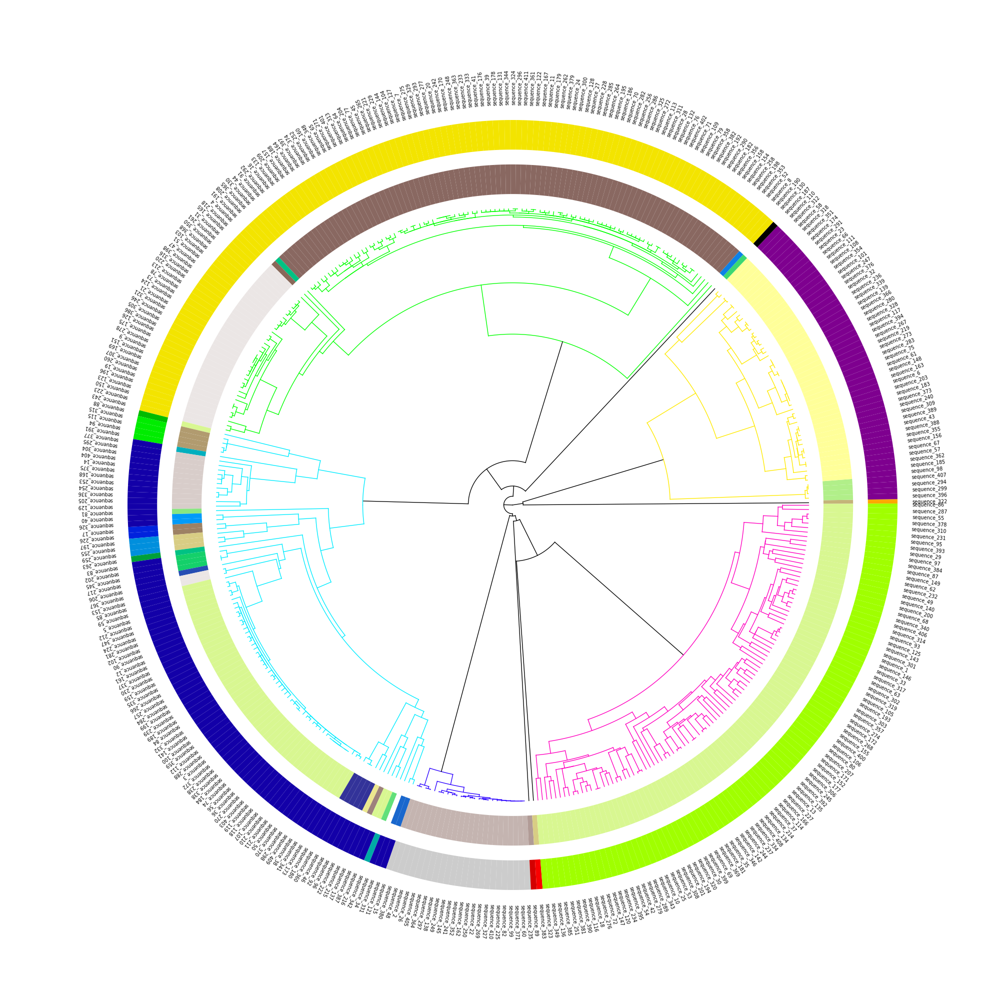

Total execution time: 0 mins 3.55 secs


In [391]:
plt.close()

radial_tree_all(muscle_df_all, sample_classes=sample_classes_411)
# plt.savefig(output_dir+'radial_treeannotated.png', dpi=200, bbox_inches='tight')

## Based on CD-HIT: the cluster reference and their proteins have identity values taken from CD-HIT instead of MSA, the identity amongst reference remains the same as MSA

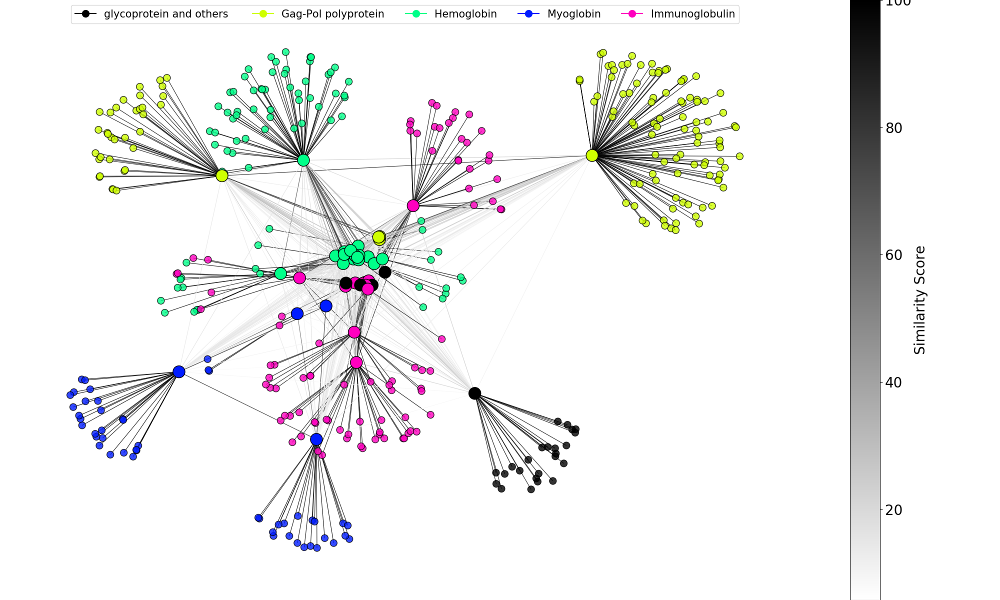

In [272]:

plt.close('all')

# sorted_muscle_df = sorted_muscle_df.apply(lambda x)
# Create a graph

# Draw the network
plt.figure(figsize=(20, 12))  # Adjust width and height as needed
G = nx.Graph()
# threshold = 15
# Add nodes to the graph

# # Define minimum and maximum threshold values
min_threshold = 1
max_threshold = 100

num_proteins = sorted_muscle_df.shape[0]
for i in range(num_proteins):
    G.add_node(i)

# PARENT ---------------------------------------------------------
            
# Add edges to the graph based on similarity scores
for i in range(num_proteins):
    for j in range(i + 1, num_proteins):
        
        i_ref = 'sequence_'+str(i + 1)
        j_ref = 'sequence_'+str(j + 1)
        if i_ref in list(reference_df['sequence_id']):
            if j_ref in list(reference_df['sequence_id']):
#                 print(i_ref, j_ref)

                similarity_score = sorted_muscle_df.loc[i_ref][j_ref]
#                 print(i_ref, j_ref, similarity_score)
                if min_threshold <= similarity_score <= max_threshold:  # Only add edges within the range
                    G.add_edge(i, j, weight=similarity_score)
                
ref_colormap = {}
for i in range(num_proteins):
#     print('sequence_'+str(i+1))
    ref = 'sequence_'+str(i+1)
    if ref in list(dendrogram_df['query_title']):
#         print(i)
#         print(i, ref, dendrogram_df[dendrogram_df['query_title'] == ref]['leaf_color'].values[0])
        ref_colormap.update({i: dendrogram_df[dendrogram_df['query_title'] == ref]['rgba'].values[0]})
    
    
    
# CHILD --------------------------------------------------------------

child_colormap = {}

for i in range(num_proteins):

    i_ref = 'sequence_'+str(i + 1)
        
    if i_ref in list(reference_df['sequence_id']):
        try:

            c_id_i = reference_df[reference_df['sequence_id'] == i_ref]['cluster_id'].values[0]
            for item in clusters_dict[c_id_i].index:
                child_ind = int(clusters_dict[c_id_i].iloc[item]['seq_id'].split('_')[1]) - 1
                ref_ind = i
                child_colormap.update({child_ind: ref_colormap[ref_ind]})
                similarity_score_child = clusters_dict[c_id_i].iloc[item]['identity (%)']
                if min_threshold <= similarity_score_child <= max_threshold:  # Only add edges within the range
                    G.add_edge(ref_ind, child_ind, weight=similarity_score_child)
        except:
            pass

full_colormap = {}
full_colormap.update(ref_colormap)
full_colormap.update(child_colormap)

sorted_colormap = {i: full_colormap[i] for i in range(num_proteins)}

# DRAW''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''

pos = nx.spring_layout(G)  # Position nodes using the spring layout algorithm

# Get edge weights
edge_weights = nx.get_edge_attributes(G, 'weight').values()

# Define colormap and normalize it
cmap = plt.cm.binary  # Choose your colormap
norm = mcolors.Normalize(vmin=min(edge_weights), vmax=max(edge_weights))

# # Draw edges with weights and colorbar
nx.draw(G, pos, with_labels=False, node_size=100, nodelist=sorted_colormap.keys(), node_color=list(sorted_colormap.values()), 
        edge_color=edge_weights, width=0.9, edge_cmap=cmap, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights), alpha=0.8, edgecolors='black')


cbar = plt.colorbar(mappable=plt.cm.ScalarMappable(norm=norm, cmap=cmap), pad=0.04)
cbar.set_label('Similarity Score', fontsize=20)

# # # Draw specific nodes with their specified colors
nx.draw_networkx_nodes(G, pos, nodelist=ref_colormap.keys(), node_color=list(ref_colormap.values()), node_size=300, edgecolors='black')


# Create custom legend handles
custom_legend = [Line2D([0], [0], color='black' if c == 'C0' else cmap_rgba[c], marker='o', markersize=10) for c in np.unique(dendrogram_df['color_code'])]

# Create custom legend labels
legend_labels = ['glycoprotein and others ', 'Gag-Pol polyprotein', 'Hemoglobin', 'Myoglobin', 'Immunoglobulin']
# Add legend with custom handles and labels

plt.legend(handles= custom_legend, labels= legend_labels, loc='upper center', fontsize=15, ncol=5)
cbar.ax.tick_params(labelsize=20)
plt.title("Protein Similarity Network")
plt.savefig(output_dir+'final_network_cdhit.png', dpi=200, bbox_inches='tight')
plt.show()

## Haemoglobin

In [309]:
HbG = {} 
hbb_names = [n for n in dendrogram_df['protein_name'] if 'Hemoglobin' in n]
for h in hbb_names:
    x = dendrogram_df[dendrogram_df['protein_name'] == h]['query_title'].values[0]
#     print('>', x)
#     colorprint(reference_df[reference_df['sequence_id'] == x]['sequence'].values[0], color='magenta')
    s_list = [cd_dict[y] for y in cd_dict.keys() if x in y][0]
    hb_list = {x: s_list}
    HbG.update(hb_list)

hb_matrix = sorted_muscle_df.loc[[y for x in HbG.values() for y in x]][[y for x in HbG.values() for y in x]]
# hb_matrix
# 


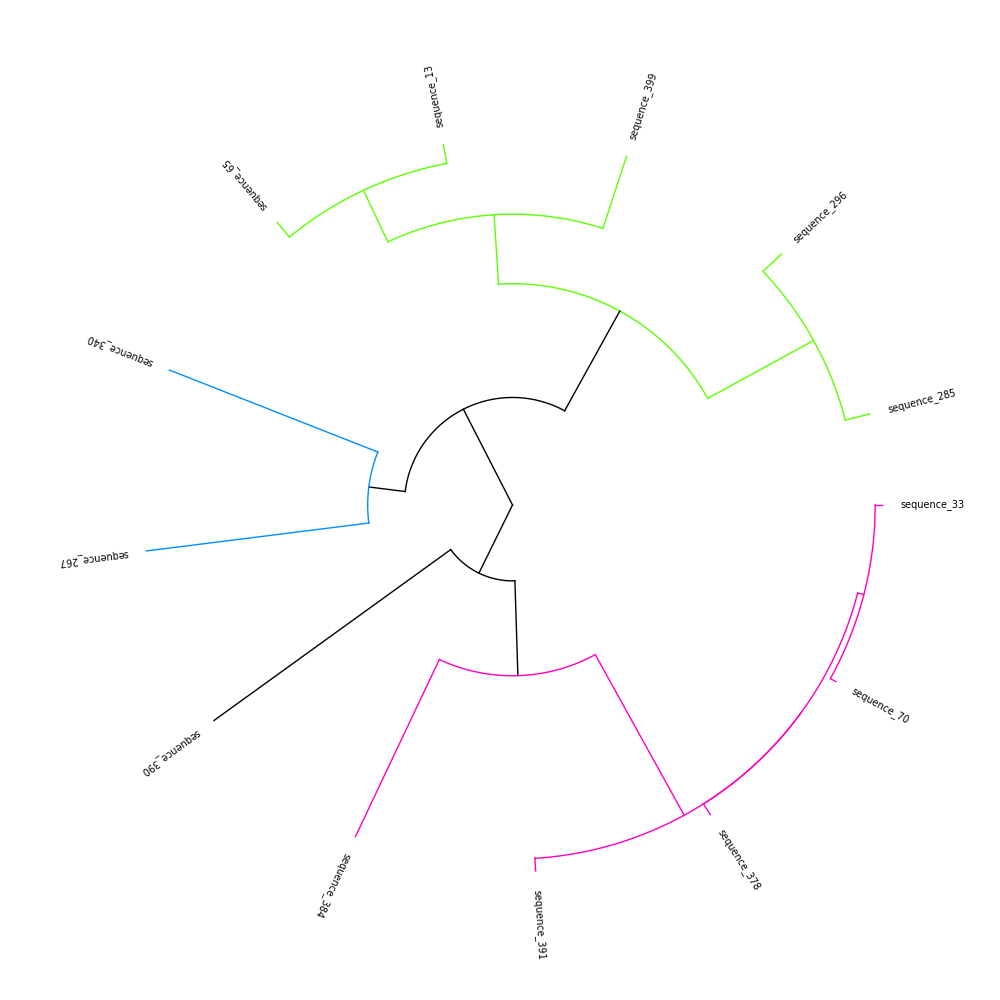

In [301]:
hb_distance = calculate_distance_matrix(hb_matrix, 'no')
# print(hb_distance)

plt.close('all')
Y_hb = hierarchy.linkage(hb_distance['values'], method='complete')  # complete clusters the farthest points (closest similarity)
# print(Y_ref_uniprot)

Z2_hb = sch.dendrogram(Y_hb, labels=hb_matrix.index, no_plot=True)

fig, ax = plt.subplots(figsize=(10, 10))

radialTreee(Z2_hb, ax=ax)

# plt.savefig(input_dir+'cd_hit_uniprot_classes.png', dpi=300, bbox_inches='tight')
plt.show()

In [429]:
colorprint(seq_file.iloc[12]['original_sequence'], 'green')
colorprint(seq_file.iloc[390]['original_sequence'], 'blue')

example = pairwise2.align.globalxx(seq_file.iloc[12]['original_sequence'], seq_file.iloc[390]['original_sequence'])[0]
print(example.seqA)
print(example.seqB)
hb_matrix.loc['sequence_13']['sequence_391']

VHLTDAEKAAVSCLWGKVNSDEVGGEALGRLLVVYPWTQRYFDSFGDLSSASAIMGNAKVKAHGKKVITAFNDGLNHLDSLKGTFASLSELHCDKLHVDPENFRLLGNMIVIVLGHHLGKDFTPAAQAAFQKVVAGVATALAHKYH
GHFTEEDKATITSLWGKVNVEDAGGETLGRLLVVYPWTQRFFDSFGNLSSASAIMGNPKVKAHGKKVLTSLGDAIKHLDDLKGTFAQLSELHCDKLHVDPENFKLLGNVLVTVLAIHFGKEFTPEVQASWQKMVTAVASALSSRYH
V-HL-TDAE--KAAV---SCLWGKVNSDEV---GGEA-LGRLLVVYPWTQRYF-DSFGD-LSSASAIMGNA-KVKAHGKKVI-TAFNDG-LN-----HLDS-LKGTFAS-LSELHCDKLHVDPENFR-LLGNMIVI-V--LGH--HL-GKD-FTPAA--QAAF--QKV-V-AGVAT-ALAHK---YH
-GH-FT--EEDK-A-TITS-LWGKVN---VEDAGGE-TLGRLLVVYPWTQR-FFDSFG-NLSSASAIMGN-PKVKAHGKKV-LT-----SL-GDAIKHLD-DLKGTFA-QLSELHCDKLHVDPENF-KLLGN--V-LVTVL--AIH-FGK-EFTP--EVQ-A-SWQK-MVTA-VA-SAL---SSRYH


69.18

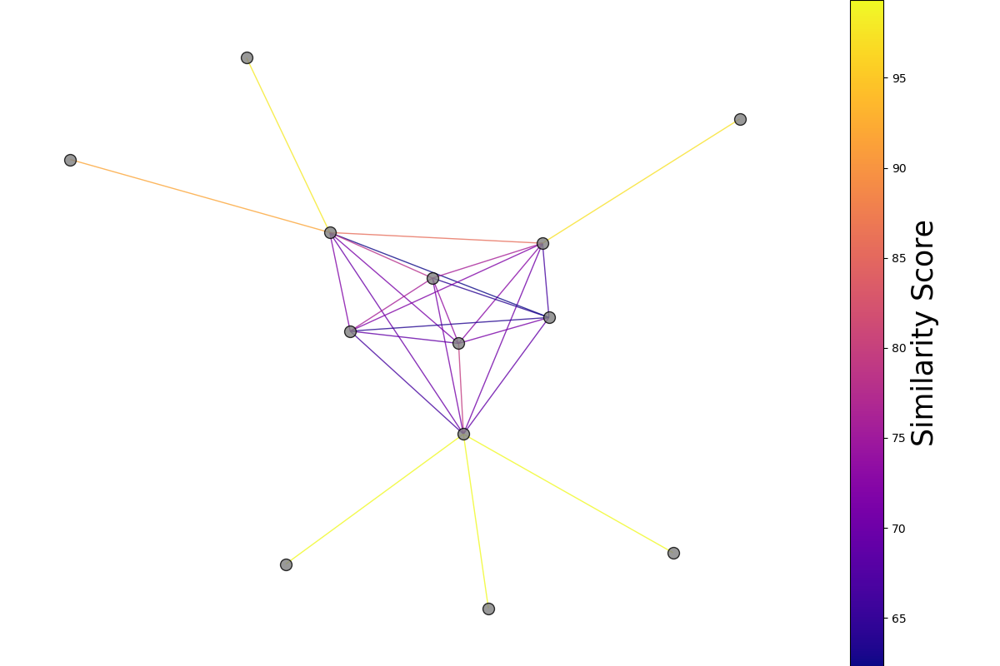

In [426]:
plt.close('all')

# Draw the network
plt.figure(figsize=(12, 8))  # Adjust width and height as needed
G = nx.Graph()


# # Define minimum and maximum threshold values
min_threshold = 1
max_threshold = 100

num_proteins = hb_matrix.shape[0]
for i in range(num_proteins):
    G.add_node(i)

# PARENT ---------------------------------------------------------
            
# Add edges to the graph based on similarity scores
for i in range(num_proteins):
    for j in range(i + 1, num_proteins):
        i_ref = hb_matrix.index[i]
        j_ref = hb_matrix.index[j]
        if i_ref in list(reference_df['sequence_id']):
            if j_ref in list(reference_df['sequence_id']):
#                 print(i_ref, j_ref)
#                 print(inum, jnum)
                similarity_score = hb_matrix.loc[i_ref][j_ref]
#                 print(i_ref, j_ref, similarity_score)
                if min_threshold <= similarity_score <= max_threshold:  # Only add edges within the range
                    G.add_edge(i, j, weight=similarity_score)
                
# CHILD ---------------------------------------------------------

for x, y in HbG.items():
    if len(y) > 1:
        ref_ind = list(hb_matrix.index).index(x)
        for item in y:
            child_ind = list(hb_matrix.index).index(item)
            if not ref_ind == child_ind:
#     #             print(ref_ind, child_ind)
                similarity_score_child = hb_matrix.iloc[ref_ind, child_ind]
                if min_threshold <= similarity_score_child <= max_threshold:  # Only add edges within the range
                    G.add_edge(ref_ind, child_ind, weight=similarity_score_child)
                

pos = nx.spring_layout(G)  # Position nodes using the spring layout algorithm

# Get edge weights
edge_weights = nx.get_edge_attributes(G, 'weight').values()

# Define colormap and normalize it
cmap = plt.cm.plasma  # Choose your colormap
norm = mcolors.Normalize(vmin=min(edge_weights), vmax=max(edge_weights))

# # Draw edges with weights and colorbar
nx.draw(G, pos, with_labels=False, node_size=100, node_color='grey', # nodelist=sorted_colormap.keys(), node_color=list(sorted_colormap.values()), 
        edge_color=edge_weights, width=1, edge_cmap=cmap, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights), alpha=0.8, edgecolors='black')


cbar = plt.colorbar(mappable=plt.cm.ScalarMappable(norm=norm, cmap=cmap), pad=0.04)
cbar.set_label('Similarity Score', fontsize=25)
plt.savefig(output_dir+'haemoglobin_net.png', dpi = 200)

plt.show()

In [424]:
import MDAnalysis as mda

aa_dict = {
    'A': ['Ala', 'Alanine'],
    'R': ['Arg', 'Arginine'],
    'N': ['Asn', 'Asparagine'],
    'D': ['Asp', 'Aspartic acid'],
    'C': ['Cys', 'Cysteine'],
    'Q': ['Gln', 'Glutamine'],
    'E': ['Glu', 'Glutamic acid'],
    'G': ['Gly', 'Glycine'],
    'H': ['His', 'Histidine'],
    'I': ['Ile', 'Isoleucine'],
    'L': ['Leu', 'Leucine'],
    'K': ['Lys', 'Lysine'],
    'M': ['Met', 'Methionine'],
    'F': ['Phe', 'Phenylalanine'],
    'P': ['Pro', 'Proline'],
    'S': ['Ser', 'Serine'],
    'T': ['Thr', 'Threonine'],
    'W': ['Trp', 'Tryptophan'],
    'Y': ['Tyr', 'Tyrosine'],
    'V': ['Val', 'Valine']
}


# converts three-letter to one letter from aa_dict
swapped_aa_dict = {v[0].upper(): k for k, v in aa_dict.items()}

for i in HbG.keys():
#     print(top_hits_df[top_hits_df['query_title'] == i][['accession','hit_from', 'hit_to', 'sciname','title']])
    struct = mda.Universe(output_dir+'structures\\pdb_files\\'+top_hits_df[top_hits_df['query_title'] == i]['accession'].values[0]+'.pdb')
    print('>',i)
    print(''.join([swapped_aa_dict[x] for x in struct.select_atoms('name CA').resnames]))

> sequence_70
MGHFTEEDKATITSLWGKVNVEDAGGETLGRLLVVYPWTQRFFDSFGNLSSASAIMGNPKVKAHGKKVLTSLGDAIKHLDDLKGTFAQLSELHCDKLHVDPENFKLLGNVLVTVLAIHFGKEFTPEVQASWQKMVTGVASALSSRYH
> sequence_384
MVHFTAEEKAAVTSLWSKMNVEEAGGEALGRLLVVYPWTQRFFDSFGNLSSPSAILGNPKVKAHGKKVLTSFGDAIKNMDNLKPAFAKLSELHCDKLHVDPENFKLLGNVMVIILATHFGKEFTPEVQAAWQKLVSAVAIALAHKYH
> sequence_390
MVHWSCEEKQFITSLWAKVNVEEVGGEALARLLIVYPWTQRFFSSFGNLSSPNAILHNAKVLAHGKKVLTSFGEAVKNLDNIKKTFAQLSELHCEKLHVDPENFKLLGNILIIVLATHFPKEFTPASQAAWTKLVNAVAHALALGYH
> sequence_340
MVNLTAAEKTQVTNLWGKVNVKELGGEALSRLLVVYPWTRRFFEHFGDLSTADAVLHNAKVLAHGEKVLTSFGEGLKHLDNLKGTFADLSELHCDKLHVDPENFRLLGNVLVIVLARHFGKEFTPDVQAAYEKVVAGVANALAHKYH
> sequence_267
GFLTAEEKGLVNGLWGKVNVDEVGGEALGRLLVVYPWTQRFFESFGDLSSADAIMSNAKVKAHGKKVLNSFSDGLKNIDDLKGAFAKLSELHCDKLHVDPENFRLLGNVLVCVLAHHFGHDFNPQVQAAFQKVVAGVANALAHKYH
> sequence_13
MVHLTDAEKAAVSCLWGKVNSDEVGGEALGRLLVVYPWTQRYFDSFGDLSSASAIMGNAKVKAHGKKVITAFNDGLNHLDSLKGTFASLSELHCDKLHVDPENFRLLGNMIVIVLGHHLGKDFTPAAQAAFQKVVAGVATALAHKYH
> sequence_285
VHLTDAEKAL

In [425]:

matrix = np.array([
    [100.00, 76.71, 73.47, 76.71, 69.39, 68.71, 71.43],
    [76.71, 100.00, 77.40, 78.77, 64.38, 71.23, 73.29],
    [73.47, 77.40, 100.00, 84.25, 63.95, 70.07, 71.43],
    [76.71, 78.77, 84.25, 100.00, 66.44, 70.55, 70.55],
    [69.39, 64.38, 63.95, 66.44, 100.00, 70.07, 75.51],
    [68.71, 71.23, 70.07, 70.55, 70.07, 100.00, 79.59],
    [71.43, 73.29, 71.43, 70.55, 75.51, 79.59, 100.00]
])

# Get the upper triangle indices
indices = np.triu_indices(matrix.shape[0], k=1)

# Get the values of the upper triangular matrix excluding diagonal
upper_triangle_values = matrix[indices]

# Calculate the range of values
range_min = np.min(upper_triangle_values)
range_max = np.max(upper_triangle_values)

print("Range of values in the upper triangular matrix (excluding diagonal):")
print("Minimum:", range_min)
print("Maximum:", range_max)


Range of values in the upper triangular matrix (excluding diagonal):
Minimum: 63.95
Maximum: 84.25


In [64]:
# from alphafetcher import AlphaFetcher

# # Instantiate the fetcher
# # The base_savedir parameter allows you to set a base directory where files will be saved.
# # Inside this directory, two separate directories for pdb and cif files will be created.
# fetcher = AlphaFetcher(base_savedir=output_dir+'structures')

# # Add desired Uniprot access codes
# fetcher.add_proteins(list(top_hits_df['accession'].unique()))

# # Retrieve metadata
# fetcher.fetch_metadata(multithread=True, workers=4)
# # Metadata available at fetcher.metadata_dict

# # Commence download of specified files
# fetcher.download_all_files(pdb=True, cif=True, multithread=True, workers=4)

## MMSEQ network 

In [465]:
mmseq_data = 'C:\\Users\\32470\\Downloads\\Biostrand_assignment\\app\\data\\'
cluster_mmseq = pd.read_csv(mmseq_data+'clusterRes_cluster.tsv', delimiter='\t', header=None)
print(cluster_mmseq)
mmseq_group = {}
for n, (x, y) in enumerate(cluster_mmseq.groupby(0), 1):
    mmseq_group.update({f'{x}': y[1]})
print(mmseq_group.keys())

                0             1
0    sequence_120  sequence_120
1    sequence_120    sequence_2
2    sequence_120   sequence_14
3    sequence_120   sequence_25
4    sequence_120   sequence_38
..            ...           ...
406  sequence_332  sequence_335
407  sequence_332  sequence_338
408  sequence_332  sequence_366
409  sequence_332  sequence_376
410  sequence_332  sequence_408

[411 rows x 2 columns]
dict_keys(['sequence_120', 'sequence_141', 'sequence_180', 'sequence_210', 'sequence_232', 'sequence_26', 'sequence_276', 'sequence_304', 'sequence_309', 'sequence_316', 'sequence_332', 'sequence_41'])


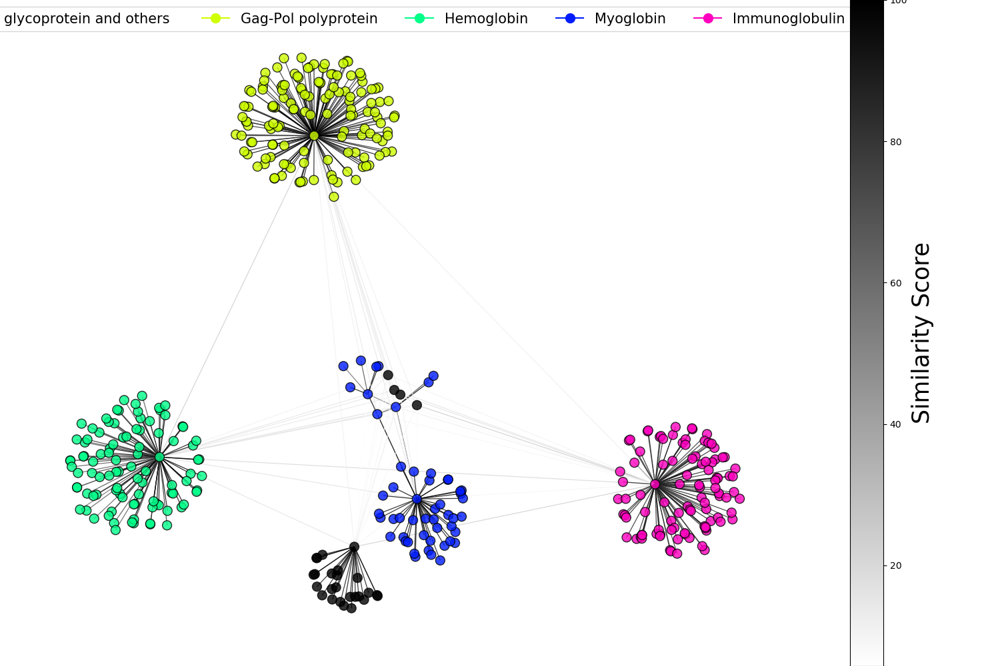

In [475]:
plt.close('all')

# Draw the network
plt.figure(figsize=(15, 10))  # Adjust width and height as needed
G = nx.Graph()


# # Define minimum and maximum threshold values
min_threshold = 1
max_threshold = 100

num_proteins = sorted_muscle_df.shape[0]
for i in range(num_proteins):
    G.add_node(i)

# PARENT ---------------------------------------------------------


# Add edges to the graph based on similarity scores
for i in range(num_proteins):
    for j in range(i + 1, num_proteins):
        
        i_ref = 'sequence_'+str(i + 1)
        j_ref = 'sequence_'+str(j + 1)
        if i_ref in list(mmseq_group.keys()):
            if j_ref in list(mmseq_group.keys()):
#                 print(i_ref, j_ref)
                similarity_score = sorted_muscle_df.loc[i_ref][j_ref]
#                 print(i_ref, j_ref, similarity_score)
                if min_threshold <= similarity_score <= max_threshold:  # Only add edges within the range
                    G.add_edge(i, j, weight=similarity_score)
                
    
# CHILD --------------------------------------------------------------


for x, y in mmseq_group.items():

    ref_ind = int(x.split('_')[1]) - 1
    for item in y:
        child_ind = int(item.split('_')[1])-1
        if not child_ind == ref_ind:
#             child_colormap.update({child_ind: ref_colormap[ref_ind]})
            similarity_score_child = sorted_muscle_df.iloc[ref_ind, child_ind]
            if min_threshold <= similarity_score_child <= max_threshold:  # Only add edges within the range
                G.add_edge(ref_ind, child_ind, weight=similarity_score_child)
                

# DRAW''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''

pos = nx.spring_layout(G)  # Position nodes using the spring layout algorithm
# print(pos)
# Get edge weights
edge_weights = nx.get_edge_attributes(G, 'weight').values()

# Define colormap and normalize it
cmap = plt.cm.binary  # Choose your colormap
norm = mcolors.Normalize(vmin=min(edge_weights), vmax=max(edge_weights))

# Draw edges with weights and colorbar
nx.draw(G, pos, with_labels=False, node_size=100, nodelist=sorted_colormap.keys(), node_color=list(sorted_colormap.values()), 
        edge_color=edge_weights, width=0.9, edge_cmap=cmap, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights), alpha=0.8, edgecolors='black')

# Create custom legend handles
custom_legend = [Line2D([0], [0], color='black' if c == 'C0' else cmap_rgba[c], marker='o', markersize=10) for c in np.unique(dendrogram_df['color_code'])]

# Create custom legend labels
legend_labels = ['glycoprotein and others ', 'Gag-Pol polyprotein', 'Hemoglobin', 'Myoglobin', 'Immunoglobulin']
# Add legend with custom handles and labels

plt.legend(handles= custom_legend, labels= legend_labels, loc='upper center', fontsize=15, ncol=5)
cbar = plt.colorbar(mappable=plt.cm.ScalarMappable(norm=norm, cmap=cmap), pad=0.04)
cbar.set_label('Similarity Score', fontsize=25)

plt.show()
plt.savefig(output_dir+'mmseq_network.png', dpi=200, bbox_inches='tight')
